<a href="https://colab.research.google.com/github/Bunnybunny1120/Master_Thesis_2023/blob/main/No_imputation_22_June.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


**Building pipeline code derived from:  https://www.freecodecamp.org/news/machine-learning-pipeline/**

Require version numbers of the libraries

In [ ]:
import sys
# print("Python version:", sys.version)

import sklearn
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib
import missingno as msno

print(f"Missingno version: {msno.__version__}")
print(f"Matplotlib version: {matplotlib.__version__}")
print("scikit-learn version:", sklearn.__version__)
print(f"Seaborn version: {sns.__version__}")
print("NumPy version:", np.__version__)
print("Pandas version:", pd.__version__)


Missingno version: 0.5.2
Matplotlib version: 3.7.1
scikit-learn version: 1.2.2
Seaborn version: 0.12.2
NumPy version: 1.22.4
Pandas version: 1.5.3


Importing Libraries

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import missingno as msno
import seaborn as sns

Importing Data

In [ ]:
df = pd.read_csv('/content/drive/MyDrive/Harbor_Water_Quality.csv')
df.shape

<ipython-input-3-c9f2b4429c1c>:1: DtypeWarning: Columns (1,5,6,7,10,11,12,13,20,26,27,33,35,36,37,38,39,40,41,46,48,49,50,51,52,53,54,57,59,60,61,63,64,65,67,68,70,76,77,79,94,95,97) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv('/content/drive/MyDrive/Harbor_Water_Quality.csv')


(89201, 100)

EDA and Preprocessing

In [ ]:
df.head()

,Sampling Location,Duplicate Sample,Sample Date,Sample Time,Weather Condition (Dry or Wet),Top Sample Temperature (ºC),Bottom Sample Temperature (ºC),Site Actual Depth (ft),Top Sample Depth(ft),Bottom Sample Depth (ft),...,Oakwood BOD Top Sample (mg/L),Oakwood BOD Bottom Sample(mg/L),Oakwood Total Suspended Solid Top Sample (mg/L),Oakwood Total Suspended Solid Bottom Sample (mg/L),Top Turbidity( Nephelometric Turbidity Units),Bottom Turbidity YSI (Nephelometric Turbidity Units),Sampling Comment,Long,Lat,Type
0,K2,NaN,07/06/1965,9:50 AM,NaN,22.8,22.2,21.0,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-74.153,40.641167,Permanent
1,N8,NaN,07/16/1909,4:10 PM,NaN,20,NaN,NaN,1.0,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-74.0455,40.606167,Permanent
2,N9,NaN,07/27/1972,9:22 AM,NaN,17.2,16.1,NaN,NaN,NaN,...,0.6,0.6,NaN,NaN,NaN,NaN,NaN,-73.983333,40.568333,Permanent
3,E3,NaN,08/28/1968,9:45 AM,NaN,22.8,22.2,NaN,NaN,NaN,...,3.6,3.7,NaN,NaN,NaN,NaN,NaN,-73.966112,40.747499,Permanent
4,N3A,NaN,08/14/1957,11:15 AM,NaN,23.3,22.8,43.0,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-73.992497,40.783330,Permanent


In [ ]:
df.info()
# feature names and datatype should be integrated

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 89201 entries, 0 to 89200
Data columns (total 100 columns):
 #   Column                                                                            Non-Null Count  Dtype  
---  ------                                                                            --------------  -----  
 0   Sampling Location                                                                 89201 non-null  object 
 1   Duplicate Sample                                                                  404 non-null    object 
 2   Sample Date                                                                       89201 non-null  object 
 3   Sample Time                                                                       86028 non-null  object 
 4   Weather Condition (Dry or Wet)                                                    32605 non-null  object 
 5   Top Sample Temperature (ºC)                                                       71763 non-null  object 
 6

Display missing value percentages of all the features in a descending order

                                               Column  MissingPercentage
0                              Bottom Depth  YSI (ft)           1.000000
1   Oakwood Total Suspended Solid Bottom Sample (m...           1.000000
2   Oakwood  Total Suspended Solid Top Sample  (mg/L)           1.000000
3                 Bottom Beam Attenuation Coefficient           1.000000
4                    Top Beam Attenuation Coefficient           1.000000
5              Bottom Dissolved Organic Carbon (mg/L)           0.999922
6                          Top Sample Depth  YSI (ft)           0.998812
7                Bottom Active Chlorophyll 'A' (µg/L)           0.997814
8                                    Duplicate Sample           0.995471
9                        Top Bacteria # per C.C. 1909           0.994148
10  Fecal Coliform Bottom Sample Less Than or Grea...           0.994036
11                    Bottom Bacteria # per C.C. 1909           0.992881
12              Bottom Total Kjeldhal Nitrogen (mg/

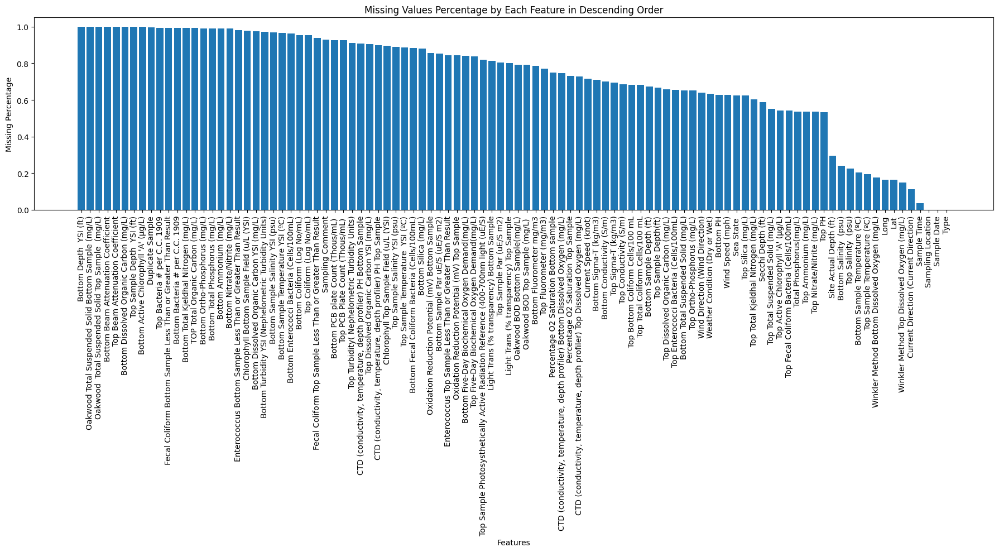

In [ ]:
# checking missing value percentage of all the features in descending order

def missing_percentage(df):
    total_missing = df.isnull().sum()
    total_cells = df.size
    percentage_missing = (total_missing / total_cells) * 100
    missing_df = pd.DataFrame({
        'Column': total_missing.index,
        'MissingPercentage': percentage_missing.values
    })
    missing_df.sort_values(by='MissingPercentage', ascending=False, inplace=True)
    missing_df.reset_index(drop=True, inplace=True)
    return missing_df

missing_df = missing_percentage(df)
# Display all features
pd.set_option('display.max_rows', None)  # To display all rows
print(missing_df)

# Create a bar plot of missing percentages
plt.figure(figsize=(18, 10))
plt.bar(missing_df['Column'], missing_df['MissingPercentage'])
plt.xticks(rotation=90)
plt.xlabel('Features')
plt.ylabel('Missing Percentage')
plt.title('Missing Values Percentage by Each Feature in Descending Order')
plt.tight_layout()
plt.show()


Descriptive statistcs

In [ ]:
#  descriptive statistcs
pd.set_option('display.max_columns', None)  # To display all columns
df.describe(include='all')


,Sampling Location,Duplicate Sample,Sample Date,Sample Time,Weather Condition (Dry or Wet),Top Sample Temperature (ºC),Bottom Sample Temperature (ºC),Site Actual Depth (ft),Top Sample Depth(ft),Bottom Sample Depth (ft),Top Salinity (psu),Bottom Salinity (psu),Top Conductivity (S/m),Bottom Conductivity (S/m),"CTD (conductivity, temperature, depth profiler) Top Dissolved Oxygen (mg/L)","CTD (conductivity, temperature, depth profiler) Bottom Dissolved Oxygen (mg/L)",Percentage O2 Saturation Top Sample,Percentage O2 Saturation Bottom sample,Light Trans (% transparency) Top Sample,Light Trans (% transparency) Bottom Sample,Top Sigma-T (kg/m3),Bottom Sigma-T (kg/m3),Top Fluorometer (mg/m3),Bottom Fluorometer mg/m3,"CTD (conductivity, temperature, depth profiler) PH Top Sample","CTD (conductivity, temperature, depth profiler) PH Bottom Sample",Top Sample Photosysthetically Active Radiation Reference (400-700nm light (uE/S),Top Sample Par (uE/S m2),Bottom Sample Par uE/S (uE/S m2),Oxidation Reduction Potential (mV) Top Sample,Oxidation Reduction Potential (mV) Bottom Sample,Current Speed (knot),Current Direction (Current Direction),Wind Speed (mph),Wind Direction (Wind Direction),Sea State,Winkler Method Top Dissolved Oxygen (mg/L),Winkler Method Bottom Dissolved Oxygen (mg/L),Secchi Depth (ft),Top PH,Bottom PH,Top Total Coliform Cells/100 mL,Top Bottom Coliform Cells/100 mL,Fecal Coliform Top Sample Less Than or Greater Than Result,Fecal Coliform Bottom Sample Less Than or Greater Than Result,Top Fecal Coliform Bacteria (Cells/100mL),Bottom Fecal Coliform Bacteria (Cells/100mL),Enterococcus Top Sample Less Than or Greater Than Result,Enterococcus Bottom Sample Less Than or Greater Than Result,Top Enterococci Bacteria (Cells/100mL),Bottom Enterococci Bacteria (Cells/100mL),Top Nitrate/Nitrite (mg/L),Bottom Nitrate/Nitrite (mg/L),Top Ammonium (mg/L),Bottom Ammonium (mg/L),Top Ortho-Phosphorus (mg/L),Bottom Ortho-Phosphorus (mg/L),Top Total Kjeldhal Nitrogen (mg/L),Bottom Total Kjeldhal Nitrogen (mg/L),Top Silica (mg/L),Bottom Silica (mg/L),Total Phosphorus(mg/L),Bottom Total Phosphorus (mg/L),Top Total Suspended Solid (mg/L),Bottom Total Suspended Solid (mg/L),Top Active Chlorophyll 'A' (µg/L),Bottom Active Chlorophyll 'A' (µg/L),Chlorophyll Top Sample Field (u/L (YSI),Chlorophyll Bottom Sample Field (u/L (YSI),TOP Total Organic Carbon (mg/L),Top Dissolved Organic Carbon (mg/L),Bottom Dissolved Organic Carbon (mg/L),Top Dissolved Organic Carbon YSI (mg/L),Bottom Dissolved Organic Carbon YSI (mg/L),Top Sample Depth YSI (ft),Bottom Depth YSI (ft),Top Sample Salinity YSI (psu),Bottom Sample Salinity YSI (psu),Top Sample Temperature YSI (ºC),Bottom Sample Temperature YSI (ºC),Top Bacteria # per C.C. 1909,Bottom Bacteria # per C.C. 1909,Top Beam Attenuation Coefficient,Bottom Beam Attenuation Coefficient,Top Five-Day Biochemical Oxygen Demand(mg/L),Bottom Five-Day Biochemical Oxygen Demand(mg/L),Top PCB Plate Count (Thous/mL),Bottom PCB plate Count (Thous/mL),Top Coliform (Log No/mL),Bottom Coliform (Log No/mL),Oakwood BOD Top Sample (mg/L),Oakwood BOD Bottom Sample(mg/L),Oakwood Total Suspended Solid Top Sample (mg/L),Oakwood Total Suspended Solid Bottom Sample (mg/L),Top Turbidity( Nephelometric Turbidity Units),Bottom Turbidity YSI (Nephelometric Turbidity Units),Sampling Comment,Long,Lat,Type
count,89201,404,89201,86028,32605,71763,70924,62787.0,29781.000000,29169.000000,69175,67682,28177.0,26728.0,24265.000000,22584.000000,24028.000000,22409.000000,17749.000000,16676.000000,27332,25933,20443.000000,19099.000000,8927.000000,8243.000000,16151.00,17402,13078.000000,13866.000000,12792.000000,25454,79269,33290,32003,33404,75789.0,73404.0,36630,41778,33207,28373.0,2.834600e+04,5561,532,40968,10522.0,13866,1807,30675,3464,41472.00,1006.00,41379,1000.0,31095,871.000000,35445,648.000000,33458,10663,41259,998.00000,39897,31001,40933.0,195.000000,9426.0,2059.0,748.000000,30436,7.000000,8436.000000,2177.000000,106.000000,0.0,9733.0,2829,10081.0000

In [ ]:
df.columns

Index(['Sampling Location', 'Duplicate Sample', 'Sample Date', 'Sample Time',
       'Weather Condition (Dry or Wet)', 'Top Sample Temperature (ºC)',
       'Bottom Sample Temperature (ºC)', 'Site Actual Depth (ft)',
       'Top Sample Depth(ft)', 'Bottom Sample Depth (ft)',
       'Top Salinity  (psu)', 'Bottom Salinity  (psu)',
       'Top Conductivity (S/m)', 'Bottom Conductivity (S/m)',
       'CTD (conductivity, temperature, depth profiler) Top Dissolved Oxygen (mg/L)',
       'CTD (conductivity, temperature, depth profiler) Bottom Dissolved Oxygen (mg/L)',
       'Percentage O2 Saturation Top Sample',
       'Percentage O2 Saturation Bottom sample',
       'Light Trans (% transparency) Top Sample',
       'Light Trans (% transparency) Bottom Sample', 'Top Sigma-T (kg/m3)',
       'Bottom Sigma-T (kg/m3)', 'Top Fluorometer (mg/m3)',
       'Bottom Fluorometer mg/m3',
       'CTD (conductivity, temperature, depth profiler) PH Top Sample',
       'CTD (conductivity, temperature, dep

Rename column names and reindexing

In [ ]:
# drop invalid columns 'Sample date', 'time', 'location', 'type', 'long','lat'...
# list of column names to drop
columns_to_drop = ['Type', 'Sample Date', 'Sample Time', 'Sampling Location', 'Long', 'Lat',
                   'Duplicate Sample', 'Top Beam Attenuation Coefficient', 'Bottom Beam Attenuation Coefficient',
                   'Sampling Comment', 'Top Sample Depth  YSI (ft)', 'Bottom Depth  YSI (ft)',
                   'Oakwood  Total Suspended Solid Top Sample  (mg/L)', 'Oakwood Total Suspended Solid Bottom Sample (mg/L)',
                   'Bottom Dissolved Organic Carbon (mg/L)']

# drop the columns
df.drop(columns_to_drop, axis=1, inplace = True)

# rename labels  Total_Suspended_Solid(TSS), Total_Kjeldhal_Nitrogen(TKN),
# CTD (conductivity, temperature, depth profiler) Top Dissolved Oxygen (mg/L)(CTD_Top_DO)
# Top Dissolved Organic Carbon (mg/L)'(Top_DOC)

df = df.rename(columns = {"Top Active Chlorophyll 'A' (µg/L)": "Top_Chlorophyll_A",
                          "Bottom Active Chlorophyll 'A' (µg/L)": "Bottom_Chlorophyll_A",
                          'Weather Condition (Dry or Wet)': 'Weather',
                          'Top Sample Temperature (ºC)':'Top_Temp', 'Bottom Sample Temperature (ºC)':'Bottom_Temp',
                          'Site Actual Depth (ft)' :'Site_Depth',
                          'Top Sample Depth(ft)': 'Top_Sample_Depth', 'Bottom Sample Depth (ft)': 'Bottom_Sample_Depth',
                          'Top Salinity  (psu)': 'Top_Salinity', 'Bottom Salinity  (psu)': 'Bottom_Salinity',
                          'Top Conductivity (S/m)':'Top_Conductivity', 'Bottom Conductivity (S/m)':'Bottom_Conductivity',
                          'CTD (conductivity, temperature, depth profiler) Top Dissolved Oxygen (mg/L)': 'CTD_Top_DO',
                          'CTD (conductivity, temperature, depth profiler) Bottom Dissolved Oxygen (mg/L)':'CTD_Bottom_DO',
                          'Percentage O2 Saturation Top Sample':'Top_O2', 'Percentage O2 Saturation Bottom sample':'Bottom_O2',
                          'Light Trans (% transparency) Top Sample':'Top_Light_Trans',
                          'Light Trans (% transparency) Bottom Sample':'Bottom_Light_Trans',
                          'Top Sigma-T (kg/m3)': 'Top_Sigma_T', 'Bottom Sigma-T (kg/m3)': 'Bottom_Sigma_T',
                          'Top Fluorometer (mg/m3)' : 'Top_Fluorometer', 'Bottom Fluorometer mg/m3': 'Bottom_Fluorometer',
                          'CTD (conductivity, temperature, depth profiler) PH Top Sample':'CTD_Top_PH',
                          'CTD (conductivity, temperature, depth profiler) PH Bottom Sample':'CTD_Bottom_PH',
                          'Top Sample Photosysthetically Active Radiation Reference (400-700nm light (uE/S)':'Top_PARR',
                          'Top Sample Par (uE/S m2)': 'Top_Par', 'Bottom Sample Par uE/S (uE/S m2)': 'Bottom_Par',
                          'Oxidation Reduction Potential (mV) Top Sample': 'Top_ORP',
                          'Oxidation Reduction Potential (mV) Bottom Sample':'Bottom_ORP',
                          'Current Speed (knot)': 'Current_Speed',
                          'Current Direction (Current Direction)': 'Current_Direction',
                          'Wind Speed (mph)':'Wind_Speed', 'Wind Direction (Wind Direction)' :'Wind_Direction',
                          'Sea State ': 'Sea_State',
                          'Winkler Method Top Dissolved Oxygen (mg/L)': 'Top_Winkler_DO',
                          'Winkler Method Bottom Dissolved Oxygen (mg/L)': 'Bottom_Winkler_DO',
                          'Secchi Depth (ft)':'Secchi_Depth',
                          'Top PH': 'Top_PH', 'Bottom PH': 'Bottom_PH',
                          'Top Total Coliform Cells/100 mL': 'Top_total_Coliform', 'Top Bottom Coliform Cells/100 mL': 'Top_Bottom_Coliform',
                          'Fecal Coliform Top Sample Less Than or Greater Than Result' :'Top_FeCo_dif',
                          'Fecal Coliform Bottom Sample Less Than or Greater Than Result':'Bottom_FeCo_dif',
                          'Top Fecal Coliform Bacteria (Cells/100mL)':'Top_FeCo',
                          'Bottom Fecal Coliform Bacteria (Cells/100mL)': 'Bottom_FeCo',
                          'Enterococcus Top Sample Less Than or Greater Than Result': 'Top_Enterococcus_dif',
                          'Enterococcus Bottom Sample Less Than or Greater Than Result': 'Bottom_Enterococcus_dif',
                          'Top Enterococci Bacteria (Cells/100mL)': 'Top Enterococci',
                          'Bottom Enterococci Bacteria (Cells/100mL)': 'Bottom_Enterococci',
                          'Top Nitrate/Nitrite (mg/L)':'Top_Nitrate', 'Bottom Nitrate/Nitrite (mg/L)': 'Bottom_Nitrate',
                          'Top Ammonium (mg/L)': 'Top_Ammonium', 'Bottom Ammonium (mg/L)': 'Bottom_Ammonium',
                          'Top Ortho-Phosphorus (mg/L)':'Top_Ortho_Phosphorus', 'Bottom Ortho-Phosphorus (mg/L)' : 'Bottom_Ortho_Phosphorus',
                          'Top Total Kjeldhal Nitrogen (mg/L)': 'Top_TKN',
                          'Bottom Total Kjeldhal Nitrogen (mg/L)':'Bottom_TKN',
                          'Top Silica (mg/L)': 'Top_Silica', 'Bottom Silica (mg/L)':'Bottom_Silica',
                          'Total Phosphorus(mg/L)': 'Total_Phosphorus', 'Bottom Total Phosphorus (mg/L)': 'Bottom_Total_Phosphorus',
                          'Top Total Suspended Solid (mg/L)':'Top_TSS', 'Bottom Total Suspended Solid (mg/L)': 'Bottom_TSS',
                          'Chlorophyll Top Sample Field (u/L (YSI)': 'Chlorophyll_Top_Field',
                          'Chlorophyll Bottom Sample Field (u/L (YSI)':'Chlorophyll_Bottom_Field',
                          'TOP Total Organic Carbon (mg/L)': 'Top_Total_Organic_Carbon',
                          'Top Dissolved Organic Carbon (mg/L)': 'Top_DOC',
                          'Top Dissolved Organic Carbon YSI (mg/L)': 'Top_DOC_YSI',
                          'Bottom Dissolved Organic Carbon YSI (mg/L)': 'Bottom_DOC_YSI',
                          'Top Sample Salinity YSI (psu)': 'Top_Salinity_YSI', 'Bottom Sample Salinity YSI (psu)': 'Bottom_Salinity_YSI',
                          'Top Sample Temperature  YSI (ºC)': 'Top_Temp_YSI', 'Bottom Sample Temperature YSI (ºC)': 'Bottom_Temp_YSI',
                          'Top Bacteria # per C.C. 1909':'Top_Bacteria_1909', 'Bottom Bacteria # per C.C. 1909': 'Bottom_Bacteria_1909',
                          'Top Five-Day Biochemical Oxygen Demand(mg/L)':'Top_BOD5',
                          'Bottom Five-Day Biochemical Oxygen Demand(mg/L)':'Bottom_BOD5',
                          'Top PCB Plate Count (Thous/mL) ': 'Top_PCB_Plate_Count',
                          'Bottom PCB plate Count (Thous/mL) ': 'Bottom_PCB_Plate_Count',
                          'Top Coliform (Log No/mL)': 'Top_Coliform', 'Bottom Coliform (Log No/mL)': 'Bottom_Coliform',
                          'Oakwood BOD Top Sample (mg/L) ': 'Top_Oakwood_BOD', 'Oakwood BOD Bottom Sample(mg/L)': 'Bottom_Oakwood_BOD',
                          'Top Turbidity( Nephelometric Turbidity Units)':'Top_Turbidity',
                          'Bottom Turbidity YSI (Nephelometric Turbidity Units)': 'Bottom_Turbidity_YSI'})


# create a list of the column names in the desired order
new_order = ['Site_Depth', 'Top_Sample_Depth','Bottom_Sample_Depth', 'Secchi_Depth',
              'Top_Turbidity', 'Bottom_Turbidity_YSI','Top_TSS', 'Bottom_TSS',
              'Top_Salinity', 'Bottom_Salinity', 'Top_Salinity_YSI',
              'Bottom_Salinity_YSI', 'Top_Conductivity', 'Bottom_Conductivity',
              'Top_Light_Trans', 'Bottom_Light_Trans', 'Top_Sigma_T', 'Bottom_Sigma_T',
              'Top_Fluorometer', 'Bottom_Fluorometer', 'Top_Temp', 'Bottom_Temp',
              'Top_Temp_YSI', 'Bottom_Temp_YSI', 'Top_PARR', 'Top_Par', 'Bottom_Par',
              'Top_ORP', 'Bottom_ORP', 'Current_Speed','Wind_Speed', 'Sea_State',
              'Top_Winkler_DO', 'Bottom_Winkler_DO', 'CTD_Top_DO', 'CTD_Bottom_DO',
              'Top_O2', 'Bottom_O2', 'Top_Oakwood_BOD', 'Bottom_Oakwood_BOD',
              'Top_BOD5', 'Bottom_BOD5', 'Top_PH', 'Bottom_PH', 'CTD_Top_PH', 'CTD_Bottom_PH',
              'Top_Nitrate', 'Bottom_Nitrate', 'Top_Ammonium', 'Bottom_Ammonium',
              'Top_Ortho_Phosphorus', 'Bottom_Ortho_Phosphorus', 'Total_Phosphorus',
              'Bottom_Total_Phosphorus', 'Top_TKN', 'Bottom_TKN', 'Top_Silica',
              'Bottom_Silica', 'Top_Total_Organic_Carbon', 'Top_DOC', 'Top_DOC_YSI',
              'Bottom_DOC_YSI', 'Top_Bacteria_1909', 'Bottom_Bacteria_1909',
              'Top_PCB_Plate_Count', 'Bottom_PCB_Plate_Count', 'Top_Coliform',
              'Bottom_Coliform', 'Top_total_Coliform', 'Top_Bottom_Coliform',
              'Top_FeCo_dif', 'Bottom_FeCo_dif', 'Top_FeCo', 'Bottom_FeCo',
              'Top_Enterococcus_dif', 'Bottom_Enterococcus_dif', 'Top Enterococci',
              'Bottom_Enterococci', 'Chlorophyll_Top_Field', 'Chlorophyll_Bottom_Field',
              'Wind_Direction', 'Current_Direction', 'Weather',
             'Top_Chlorophyll_A', 'Bottom_Chlorophyll_A']

# use the reindex() method to reorder the columns
df = df.reindex(columns=new_order)
print('dropping invalid columns', df.shape)

dropping invalid columns (89201, 85)


In [ ]:
df.sample(10)

,Site_Depth,Top_Sample_Depth,Bottom_Sample_Depth,Secchi_Depth,Top_Turbidity,Bottom_Turbidity_YSI,Top_TSS,Bottom_TSS,Top_Salinity,Bottom_Salinity,...,Bottom_Enterococcus_dif,Top Enterococci,Bottom_Enterococci,Chlorophyll_Top_Field,Chlorophyll_Bottom_Field,Wind_Direction,Current_Direction,Weather,Top_Chlorophyll_A,Bottom_Chlorophyll_A
18236,14.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,28.35,28.35,...,NaN,NaN,NaN,NaN,NaN,NaN,E,NaN,NaN,NaN
1390,42.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,28.7,28.7,...,NaN,NaN,NaN,NaN,NaN,NaN,S,NaN,NaN,NaN
78870,12,NaN,NaN,5,0.9,1.5,10.4,4,NaN,NaN,...,NaN,NaN,NaN,1,1,NaN,NaN,D,1.0,0.9
30909,35.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,21,21.35,...,NaN,NaN,NaN,NaN,NaN,NaN,S,NaN,NaN,NaN
75843,20,4.0,17.0,2,NaN,NaN,7.2,24.4,21.19,22.64,...,NaN,3120,1720,NaN,NaN,NaN,W,W,37.7,NaN
80908,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
24130,40.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,23.2,25.2,...,NaN,NaN,NaN,NaN,NaN,NaN,E,NaN,NaN,NaN
42595,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,28.2,28,...,NaN,NaN,NaN,NaN,NaN,NaN,W,NaN,NaN,NaN
21458,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,14.0,15.1,...,NaN,NaN,NaN,NaN,NaN,NaN,W,NaN,NaN,NaN
14319,30.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,28,28.35,...,NaN,NaN,NaN,NaN,NaN,NaN,S,NaN,NaN,NaN


Removing rows without target values and removing columns having less than 1000 data points

In [ ]:
# Rows that does not contain target values is removed
df = df.dropna(subset=['Top_Chlorophyll_A'])
print('After exclude rows that do not contain target value', df.shape)

# drop columns that has less than 1000 values
counts = df.count()
mask = counts < 1000
df = df.drop(columns=df.columns[mask])
print('After excluding rows that has less than 1000 entries', df.shape)

After exclude rows that do not contain target value (40933, 85)
After excluding rows that has less than 1000 entries (40933, 71)


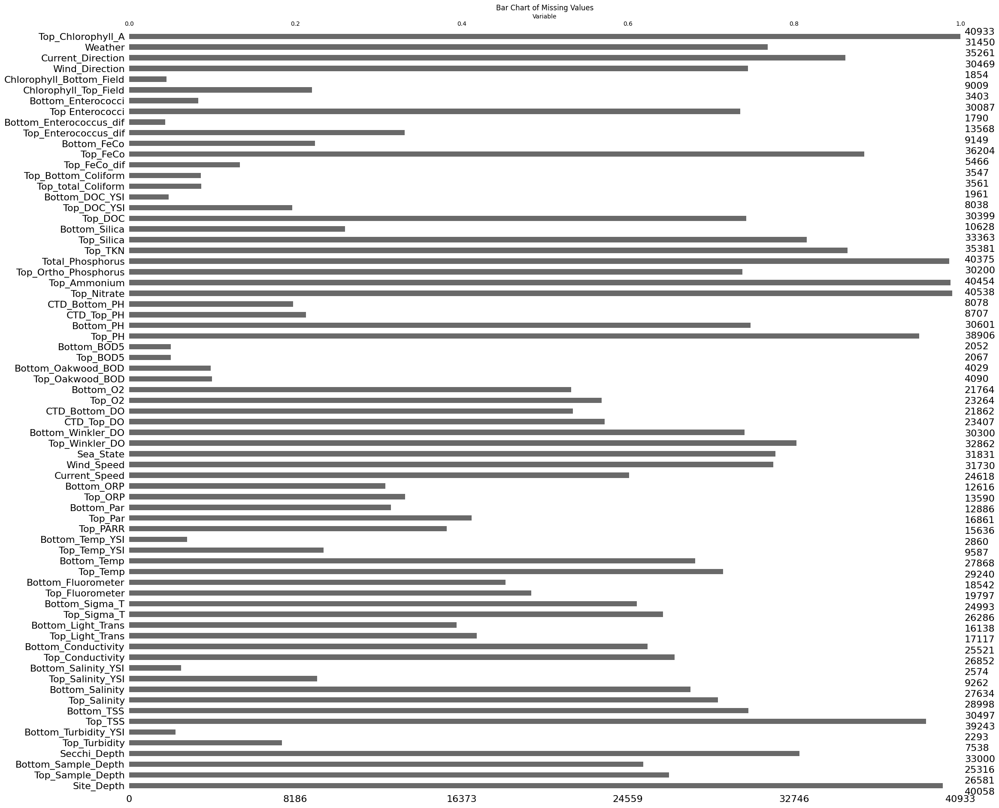

In [ ]:
msno.bar(df)
# add labels to the plot
plt.title('Bar Chart of Missing Values')
plt.xlabel('Variable')
plt.ylabel('Number of Missing Values')
plt.show()

In [ ]:
# remove the minority of the top and bottom features,
# For instance, the target value 'Top_TKN contains 35381 values and 'Bottom_TKN' contains only 638 values.
# In order to make most use of existing data, the later is removed.
cols_to_drop = ['Bottom_Par', 'Bottom_Enterococci',
                'Bottom_DOC_YSI', 'Bottom_Salinity_YSI', 'Bottom_Silica',
                'Bottom_FeCo', 'Bottom_Turbidity_YSI', 'Chlorophyll_Bottom_Field', 'Top_DOC_YSI']
df.drop(cols_to_drop, axis=1, inplace = True)
df.shape

(40933, 62)

In [ ]:
# Change data type into numeric Define a list of columns to exclude from numeric conversion
exclude_cols = ['Weather', 'Current_Direction', 'Wind_Direction', 'Sea_State']

# Convert all other columns to numeric values
for col in df.columns:
    if col not in exclude_cols:
        df[col] = pd.to_numeric(df[col], errors='coerce')
df.shape

 # drop columns that has less than 1000 values
counts = df.count()
mask = counts < 1000
df = df.drop(columns=df.columns[mask])
df.shape

(40933, 59)

In [ ]:

print(df['Current_Direction'].isna().sum())
print(df['Wind_Direction'].isna().sum())
print(df['Sea_State'].isna().sum())

5672
10464
9102


In [ ]:
# to view all value_counts()
pd.set_option('display.max_rows', None)
print(df['Current_Direction'].value_counts())
print(df['Wind_Direction'].value_counts())
print(df['Weather'].value_counts())
print(df['Sea_State'].value_counts())

S           8487
E           7096
W           6223
N           5958
NE          1453
SW          1381
SE           885
NW           831
0            635
SLACK        114
SSW           96
EBB           70
NNE           68
.             68
NNW           56
0.6           53
ESE           52
1             50
ENE           49
FLOOD         45
Slack         44
0.5           41
WNW           39
0.3           34
SLK           34
FLD           33
0.2           33
*             33
Ebb           31
0.9           31
SSE           29
0.4           27
SLY           26
WSW           26
0.8           25
ELY           23
1.1           22
0.7           22
1.4           19
1.2           18
flood         16
S-0.2         16
N-1.0         15
2             15
slack         15
N-0.2         14
S-0.3         14
LW 0          14
0.1           13
ND            13
1.5           12
W-0.3         12
W-0.8         11
S-0.5         11
1.7           11
S-0.4         11
S-0.8         10
W-0.7         10
W-0.6         

Treating categorical data: weather, wind_direction, current_direction

In [ ]:
# #### Weather feature cleaning
# replace 'Dry' with 'D' and 'Wet' with 'W'
df['Weather'].replace({'Dry': 'D', 'Wet': 'W'}, inplace=True)
# replace '*' and 'F' with missing values
df['Weather'].replace(['*', 'F'], np.nan, inplace=True)

### Wind_Direction feature cleaning
# Convert all values to uppercase
df['Wind_Direction'] = df['Wind_Direction'].str.upper()
# Replace non-alphabetic characters with an empty string
df['Wind_Direction'] = df['Wind_Direction'].str.replace('[^A-Z]', '', regex=True)
# Replace misspelled or non-standard values with their correct equivalents
df['Wind_Direction'].replace({'NLY': 'N', 'NWLY': 'NW', 'SLY': 'S', 'WLY': 'W',
                              'ELY': 'E', 'SELY': 'SE', 'SWLY': 'SW', 'ND': 'N',
                              'NELY': 'NE', 'NLW': 'NW', 'EAST': 'E', 'NWW': 'WNW',
                              'WWN': 'WNW', 'SWS': 'SSW', 'WS': 'SW', 'NEL': 'NE',
                              'NLW': 'NW', 'SXELY': 'SE', 'WNN': 'NNW', 'ENELY':'ENE',
                              'NWNLY': 'NNW', 'WNLY': 'NW', 'NWL': 'NW', 'WNWLY':'WNW',
                              'SWL': 'SW', 'ES': 'SE', 'NS':'', ' SW':'SW',
                              ' NE': 'NE', 'EXS': 'SE', 'CALM': '',
                              'AIRS': '', 'O': '', 'LTVAR': '',
                              'LTAIRS': '', 'VAR': '', 'LIGHTAIR':'',
                              'SLK':'', 'M': '', 'OO': '',
                              'CAML': '', 'LTAIR': '', 'QSQ': '',
                              'AIR': '', 'LTWI':'', 'SLACK':''}, inplace=True)

# 'N', 'NNE', 'NE', 'ENE', 'E', 'ESE', 'SE', 'SSE', 'S', 'SSW', 'SW', 'WSW', 'W', 'WNW', 'NW', 'NNW'
df['Wind_Direction'].replace([''], np.nan, inplace=True)

### Current_Direction feature cleaning
# Convert all values to uppercase
df['Current_Direction'] = df['Current_Direction'].str.upper()
# Replace non-alphabetic characters with an empty string
df['Current_Direction'] = df['Current_Direction'].str.replace('[^A-Z]', '', regex=True)
df['Current_Direction'].replace({'SLACK': '', 'FLOOD': '', 'FLOODING':'', 'FLDNE' :'NE',
                                 'FLOW':'W', 'EBB': '', 'SLK': '', 'F': '',
                                 'SWLY' : 'SW', 'SWSW':'SW', 'NLY': 'N', 'SLY': 'S',
                                 'ELY': 'E', 'WLY': 'W', 'LW': 'W', 'NONE': '',
                                 'OO': '', 'HW': 'W', 'WEST': 'W', 'EBBNE':'NE',
                                 'EBBSW': 'SW', 'ND':'N', 'WEAK': '', 'NS': '',
                                 'O': '', 'LWSLK': 'W', 'WW': 'W', 'CALM': '',
                                 'WWN': 'WNW', 'NN':'N', 'SS': 'S', 'WN': 'NW',
                                 'VAR': '', 'EB': '', 'FLD': '', 'SSW': 'SW',
                                }, inplace=True)
df['Current_Direction'].replace([''], np.nan, inplace=True)

# cardinal_directions = ['N', 'NNE', 'NE', 'ENE', 'E', 'ESE', 'SE', 'SSE', 'S', 'SSW', 'SW', 'WSW', 'W', 'WNW', 'NW', 'NNW' ]
# North (N)
# North-northeast (NNE)
# Northeast (NE)
# East-northeast (ENE)
# East (E)
# East-southeast (ESE)
# Southeast (SE)
# South-southeast (SSE)
# South (S)
# South-southwest (SSW)
# Southwest (SW)
# West-southwest (WSW)
# West (W)
# West-northwest (WNW)
# Northwest (NW)
# North-northwest (NNW)

###Sea_State feature cleaning, converted into float becuase the order has a meaning
df['Sea_State'] = df['Sea_State'].str.upper()
df['Sea_State'] = df['Sea_State'].str.strip()
df['Sea_State'].replace({'CALM':'0', 'SWELL': '1', 'CHOP' : '2', '2(SWELL)': '2',
                         '5': '5', '1.5': '1.5', '2.5':'2.5', '*': '',
                         'ND': '', '1.0': '1', '2.0': '2', '3.0': '3', '0-1': '0.5',
                         '3-Feb': '3', 'CHOPPY 2.5': '2.5', 'TRAFFIC SWELL':'3',
                         '3-FEB': '3', '2~3': '2.5', '2-3': '2.5', 'LITE CHAP': '1.5',
                         '1 SE SWELL': '1', '1-2': '1.5', '2 / 3': '2.5'}, inplace=True)
# num = ['0','0.5','1','1.5','2','2.5','3','5', 'Others']
# df = df[df['Sea_State'].isin(num)]
#change 'Sea_State' into numeric value, since the number stands for the scale
df['Sea_State'].replace([''], np.nan, inplace=True)
df['Sea_State'] = pd.to_numeric(df['Sea_State'], errors='coerce')

print('after modify invalid entries as missing values of categorical data', df.shape)

after modify invalid entries as missing values of categorical data (40933, 59)


In [ ]:
pd.set_option('display.max_rows', None)
print(df['Current_Direction'].value_counts())
print(df['Wind_Direction'].value_counts())
print(df['Weather'].value_counts())

S      8669
E      7216
W      6378
N      6098
SW     1503
NE     1495
SE      910
NW      845
NNE      70
NNW      56
ESE      52
ENE      49
WNW      42
SSE      29
WSW      26
Name: Current_Direction, dtype: int64
S      5644
W      4726
N      4249
SW     2891
E      2820
NW     2726
NE     2196
SE     1292
SSW     540
NNW     447
NNE     376
WNW     322
WSW     279
ESE     255
ENE     252
SSE     192
Name: Wind_Direction, dtype: int64
D    21185
W    10258
Name: Weather, dtype: int64


Combine top and bottom values into one average value and reindexing

In [ ]:
# combine top and bottom into one average value
df['Temp'] = df[['Top_Temp', 'Bottom_Temp']].mean(axis=1, skipna=False)
df['Sample_Depth'] = df[['Top_Sample_Depth', 'Bottom_Sample_Depth']].mean(axis=1, skipna=False)
df['Conductivity'] = df[['Top_Conductivity', 'Bottom_Conductivity']].mean(axis=1, skipna=False)
df['Salinity'] = df[['Top_Salinity', 'Bottom_Salinity']].mean(axis=1, skipna=False)
df['CTD_DO'] = df[['CTD_Top_DO', 'CTD_Bottom_DO']].mean(axis=1, skipna=False)
df['Light_Trans'] = df[['Top_Light_Trans', 'Bottom_Light_Trans']].mean(axis=1, skipna=False)
df['O2'] = df[['Top_O2', 'Bottom_O2']].mean(axis=1, skipna=False)
df['Sigma_T'] = df[['Top_Sigma_T', 'Bottom_Sigma_T']].mean(axis=1, skipna=False)
df['Fluorometer'] = df[['Top_Fluorometer', 'Bottom_Fluorometer']].mean(axis=1, skipna=False)
df['CTD_PH'] = df[['CTD_Top_PH', 'CTD_Bottom_PH']].mean(axis=1, skipna=False)
df['ORP'] = df[['Top_ORP', 'Bottom_ORP']].mean(axis=1, skipna=False)
df['Winkler_DO'] = df[['Top_Winkler_DO', 'Bottom_Winkler_DO']].mean(axis=1, skipna=False)
df['PH'] = df[['Top_PH', 'Bottom_PH']].mean(axis=1, skipna=False)
df['TSS'] = df[['Top_TSS', 'Bottom_TSS']].mean(axis=1, skipna=False)
df['Temp_YSI'] = df[['Top_Temp_YSI', 'Bottom_Temp_YSI']].mean(axis=1, skipna=False)
df['BOD5'] = df[['Top_BOD5', 'Bottom_BOD5']].mean(axis=1, skipna=False)
df['Coliform'] = df[['Top_total_Coliform', 'Top_Bottom_Coliform']].mean(axis=1, skipna=False)
df['BOD_Oakwood'] = df[['Top_Oakwood_BOD', 'Bottom_Oakwood_BOD']].mean(axis=1, skipna=False)
print('creating 18 features of avg values 59+18 =77', df.shape)

# drop old coulms before merging
cols_2_drop = ['Top_Temp', 'Bottom_Temp', 'Top_Sample_Depth', 'Bottom_Sample_Depth', 'Top_Salinity',
                'Bottom_Salinity', 'Top_Conductivity', 'Bottom_Conductivity', 'CTD_Top_DO', 'CTD_Bottom_DO',
                'Top_O2', 'Bottom_O2', 'Top_Light_Trans', 'Bottom_Light_Trans', 'Top_Sigma_T', 'Bottom_Sigma_T',
                'Top_Fluorometer', 'Bottom_Fluorometer', 'CTD_Top_PH', 'CTD_Bottom_PH', 'Top_ORP', 'Bottom_ORP',
                'Top_Winkler_DO', 'Bottom_Winkler_DO', 'Top_PH', 'Bottom_PH', 'Top_TSS', 'Bottom_TSS',
                'Top_Temp_YSI', 'Bottom_Temp_YSI', 'Top_BOD5', 'Bottom_BOD5','Top_total_Coliform',
               'Top_Bottom_Coliform','Top_Oakwood_BOD', 'Bottom_Oakwood_BOD']

df = df.drop(columns=cols_2_drop)
# re-order the columns
new_order2 = ['Site_Depth', 'Sample_Depth', 'Secchi_Depth', 'Top_Turbidity',
               'Light_Trans', 'Conductivity', 'Salinity', 'Top_Salinity_YSI', 'Sigma_T',
               'Fluorometer', 'Top_PARR', 'Top_Par', 'Current_Speed', 'Wind_Speed', 'Sea_State',
               'Temp', 'Temp_YSI', 'Top_Nitrate', 'Top_Ammonium', 'Top_Ortho_Phosphorus',
               'Total_Phosphorus', 'Top_TKN', 'Top_Silica', 'Top_DOC', 'CTD_DO',
               'Winkler_DO','ORP', 'O2', 'CTD_PH', 'PH', 'TSS', 'BOD5','BOD_Oakwood', 'Coliform',
               'Top Enterococci', 'Top_FeCo', 'Chlorophyll_Top_Field',
               'Wind_Direction', 'Current_Direction', 'Weather', 'Top_Chlorophyll_A']
# use the reindex() method to reorder the columns
df = df.reindex(columns=new_order2)
df = df.dropna(subset=['Top_Chlorophyll_A'])
print('removing old columns', df.shape)

creating 18 features of avg values 59+18 =77 (40933, 77)
removing old columns (40932, 41)


In [ ]:
df.columns

Index(['Site_Depth', 'Sample_Depth', 'Secchi_Depth', 'Top_Turbidity',
       'Light_Trans', 'Conductivity', 'Salinity', 'Top_Salinity_YSI',
       'Sigma_T', 'Fluorometer', 'Top_PARR', 'Top_Par', 'Current_Speed',
       'Wind_Speed', 'Sea_State', 'Temp', 'Temp_YSI', 'Top_Nitrate',
       'Top_Ammonium', 'Top_Ortho_Phosphorus', 'Total_Phosphorus', 'Top_TKN',
       'Top_Silica', 'Top_DOC', 'CTD_DO', 'Winkler_DO', 'ORP', 'O2', 'CTD_PH',
       'PH', 'TSS', 'BOD5', 'BOD_Oakwood', 'Coliform', 'Top Enterococci',
       'Top_FeCo', 'Chlorophyll_Top_Field', 'Wind_Direction',
       'Current_Direction', 'Weather', 'Top_Chlorophyll_A'],
      dtype='object')

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 40932 entries, 6 to 89199
Data columns (total 41 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   Site_Depth             40054 non-null  float64
 1   Sample_Depth           25220 non-null  float64
 2   Secchi_Depth           32990 non-null  float64
 3   Top_Turbidity          7537 non-null   float64
 4   Light_Trans            16081 non-null  float64
 5   Conductivity           25461 non-null  float64
 6   Salinity               27570 non-null  float64
 7   Top_Salinity_YSI       9261 non-null   float64
 8   Sigma_T                24897 non-null  float64
 9   Fluorometer            18425 non-null  float64
 10  Top_PARR               15633 non-null  float64
 11  Top_Par                16855 non-null  float64
 12  Current_Speed          21457 non-null  float64
 13  Wind_Speed             29564 non-null  float64
 14  Sea_State              28066 non-null  float64
 15  Te

visualize categorical data relationship

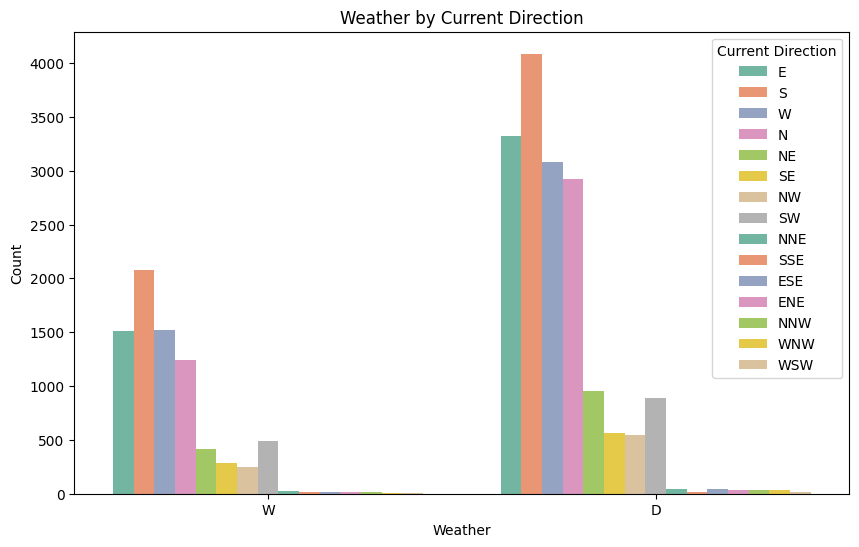

In [ ]:
#check correaltion between categorical data
# Create a contingency table
contingency_table = pd.crosstab(df['Weather'], [df['Current_Direction']])

# Plot the contingency table as a grouped bar chart
plt.figure(figsize=(10, 6))
sns.countplot(data=df, x='Weather', hue='Current_Direction', palette='Set2')
plt.title('Weather by Current Direction')
plt.xlabel('Weather')
plt.ylabel('Count')
plt.legend(title='Current Direction')
plt.show()

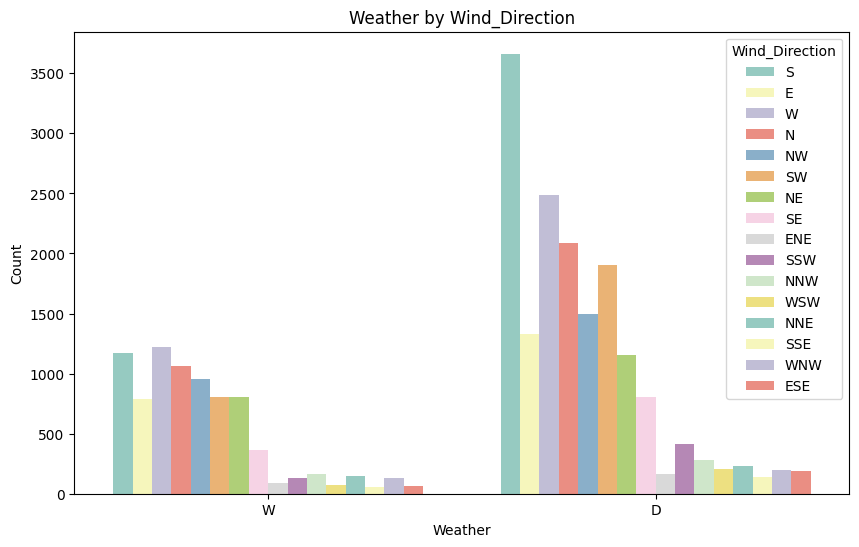

In [ ]:
#check correaltion between categorical data
# Create a contingency table
contingency_table = pd.crosstab(df['Weather'], [df['Wind_Direction']])

# Plot the contingency table as a grouped bar chart
plt.figure(figsize=(10, 6))
sns.countplot(data=df, x='Weather', hue='Wind_Direction', palette='Set3')
plt.title('Weather by Wind_Direction')
plt.xlabel('Weather')
plt.ylabel('Count')
plt.legend(title='Wind_Direction')
plt.show()


In [ ]:
#check correaltion between categorical data
# Create a contingency table
contingency_table = pd.crosstab(df['Weather'], [df['Wind_Direction']])

# Plot the contingency table as a grouped bar chart
plt.figure(figsize=(10, 6))
sns.countplot(data=df, x='Weather', hue='Wind_Direction', palette='Set3')
plt.title('Weather by Wind_Direction')
plt.xlabel('Weather')
plt.ylabel('Count')
plt.legend(title='Wind_Direction')
plt.show()


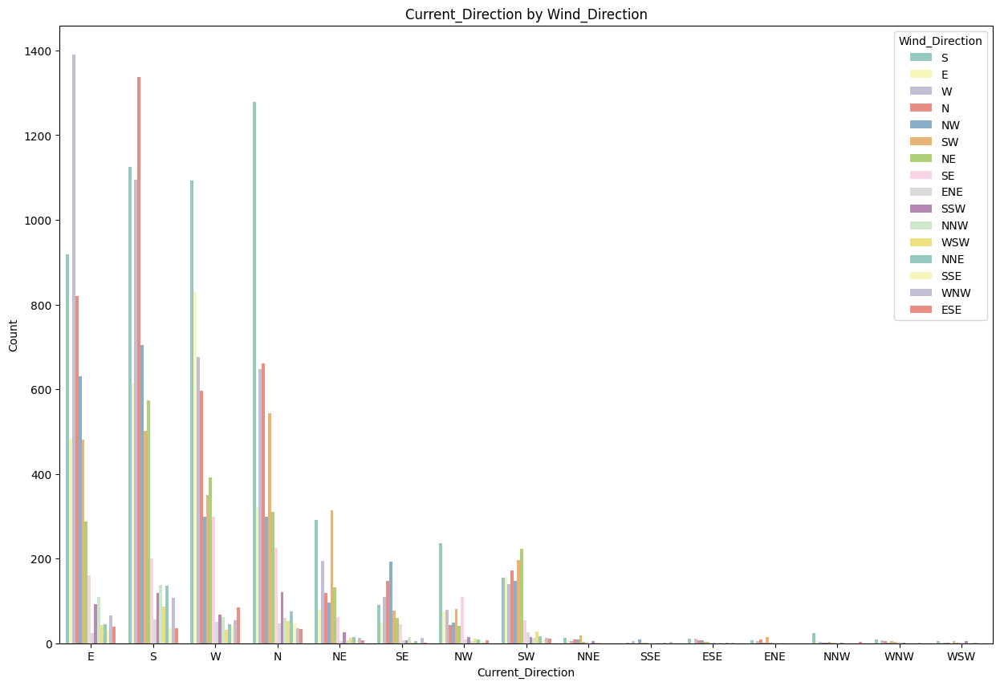

In [ ]:
contingency_table = pd.crosstab(df['Current_Direction'], df['Wind_Direction'])
plt.figure(figsize=(15, 10))
sns.countplot(data=df, x='Current_Direction', hue='Wind_Direction', palette='Set3')
plt.title('Current_Direction by Wind_Direction')
plt.xlabel('Current_Direction')
plt.ylabel('Count')
plt.legend(title='Wind_Direction')
plt.show()


visualize numeric data relation

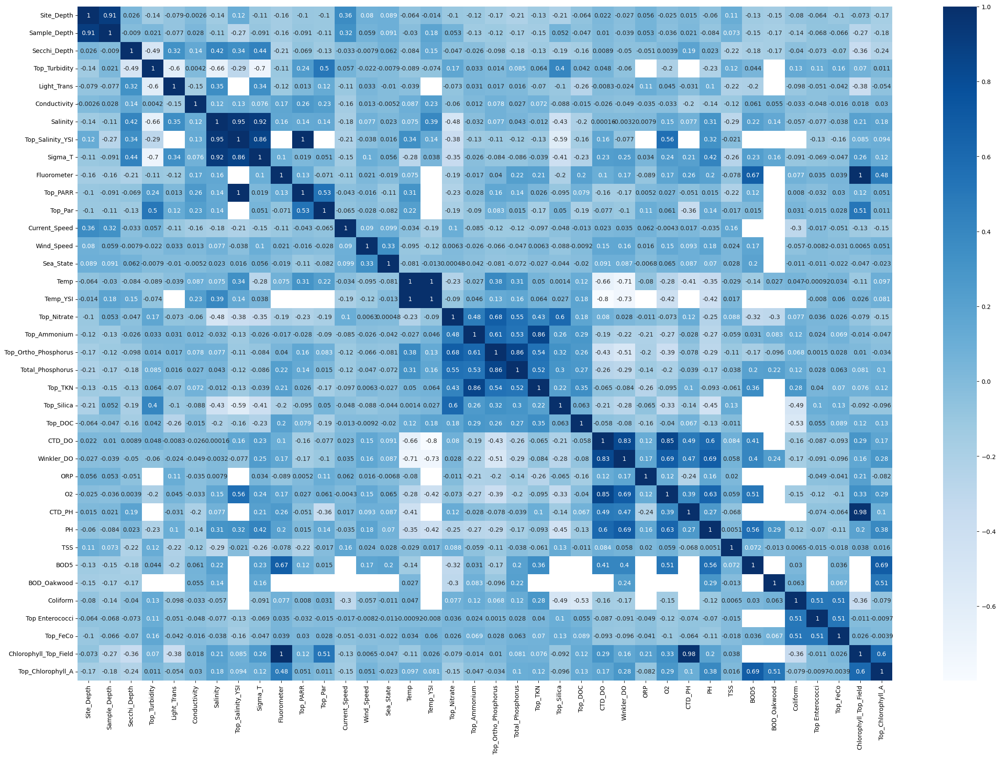

In [ ]:
import seaborn as sns
# only use numeric cols 41-3 = 38 columns incl.target    (40932, 41)
numeric_cols = [col for col in df.columns if df[col].dtype != 'object']
# Create a heatmap using Seaborn
plt.figure(figsize=(30, 20))
sns.heatmap(df[numeric_cols].corr(), cmap='Blues', annot=True)
plt.show()
# plt.savefig('/content/drive/MyDrive/Colab Notebooks/heatmapbefore.png', dpi=300)

In [ ]:
# drop columns that are highly correlated step 1
# Sample_Depth and Site_Depth (0.91), the missing data count: 15712 vs 878, so  Sample_Depth is removed.
# Salinity and 'Top_Salinity_YSI'(0.95),  the missing data count: 13362 vs 31671, so Top_Salinity_YSI is removed.

cols_drop = ['Sample_Depth','Top_Salinity_YSI']
df = df.drop(columns=cols_drop)
print('after removing Sample_Depth and Top_Salinity_YSI df shape', df.shape)

after removing Sample_Depth and Top_Salinity_YSI df shape (40932, 39)


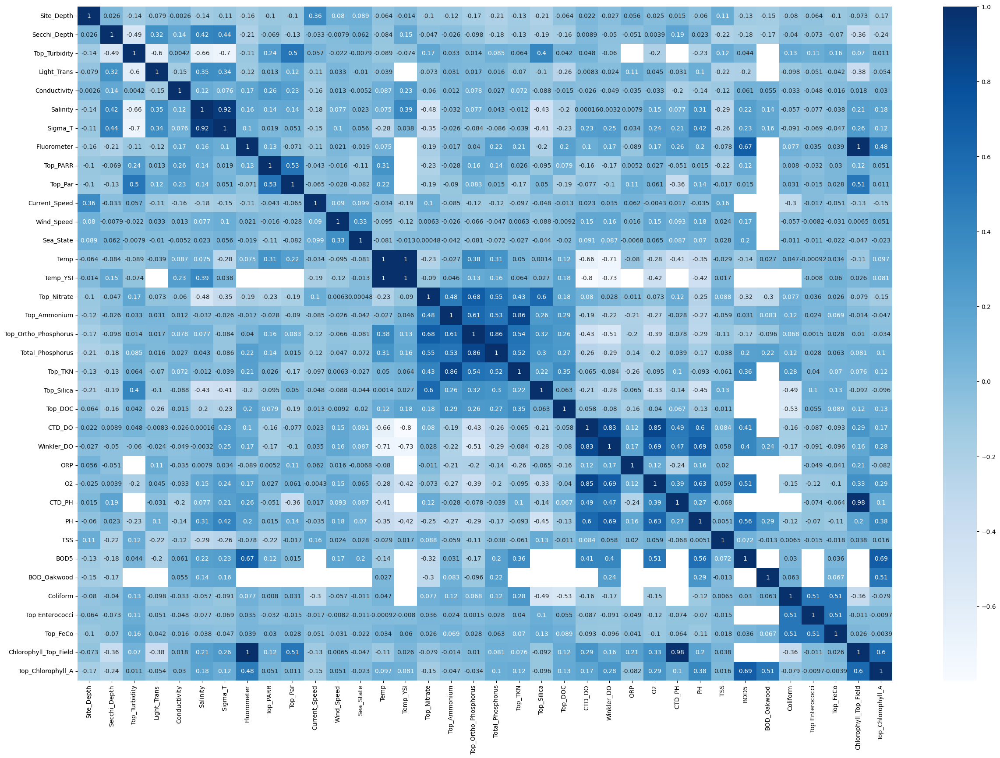

In [ ]:
# only use numeric cols
numeric_cols = [col for col in df.columns if df[col].dtype != 'object']
# Create a heatmap using Seaborn
plt.figure(figsize=(30, 20))
sns.heatmap(df[numeric_cols].corr(), cmap='Blues', annot=True)
plt.show()

In [ ]:
# drop columns that are highly correlated step 2
# Salinity and sigma-T (0.92) the missing data count: 13362 vs 16035, so Sigma_T is removed.

cols_drop = ['Sigma_T']
df = df.drop(columns=cols_drop)
print('after removing Sigma-T df shape', df.shape)

after removing Sigma-T df shape (40932, 38)


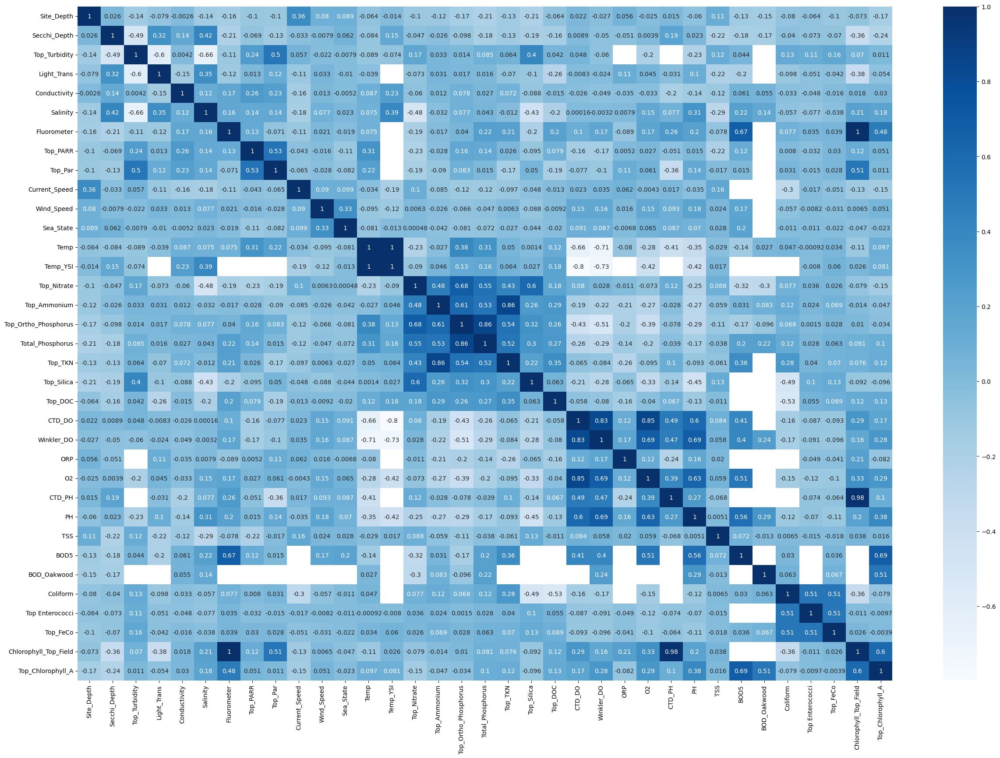

In [ ]:
# only use numeric cols
numeric_cols = [col for col in df.columns if df[col].dtype != 'object']
# Create a heatmap using Seaborn
plt.figure(figsize=(30, 20))
sns.heatmap(df[numeric_cols].corr(), cmap='Blues', annot=True)
plt.show()

In [ ]:

# drop columns that are highly correlated step 3
# Temp and Temp_YSI (1),  the missing data count: 13122 vs 38079, so Temp_YSI is removed.
# Top_Ammonium and Top_TKN (0.86), the missing data count: 503 vs 5567, so Top_TKN is removed.
# Top_Ortho_Phosphorus and Total_Phosphorus (0.86), the missing data count: 587 vs 10838, so Top_Ortho_Phosphorus is removed.


cols_drop = ['Temp_YSI','Top_TKN', 'Top_Ortho_Phosphorus']
df = df.drop(columns=cols_drop)
print('after removing Temp_YSI, top_TKN and Top_Ortho_Phosphorusdf shape', df.shape)

after removing Temp_YSI, top_TKN and Top_Ortho_Phosphorusdf shape (40932, 35)


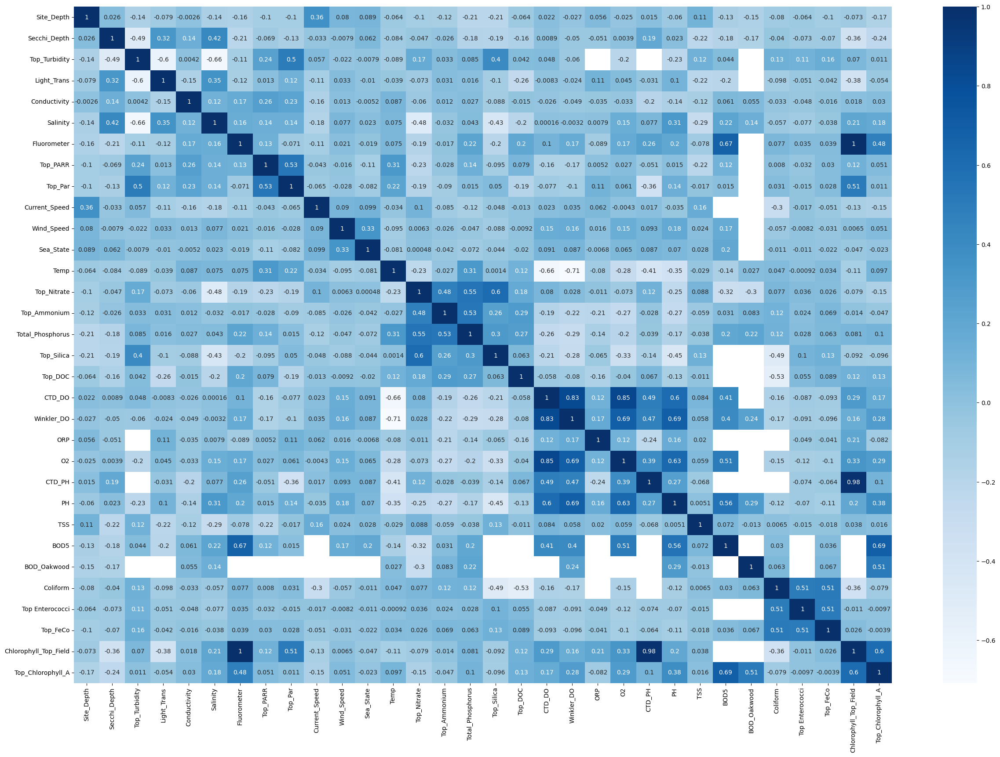

In [ ]:
# only use numeric cols
numeric_cols = [col for col in df.columns if df[col].dtype != 'object']
# Create a heatmap using Seaborn
plt.figure(figsize=(30, 20))
sns.heatmap(df[numeric_cols].corr(), cmap='Blues', annot=True)
plt.show()

In [ ]:

# 'Fluorometer' measures it in real-time using fluorescence,
# while 'Chlorophyll_Top_Field' measures it in a laboratory using spectrophotometry on a water sample


# drop columns that are highly correlated step 4
# 'Fluorometer' and 'Chlorophyll_Top_Field'(1)  the missing data count: 22507 vs 31932, so Chlorophyll_Top_Field is removed.

cols_drop = ['Chlorophyll_Top_Field']
df = df.drop(columns=cols_drop)
print('after removing Chlorophyll_Top_Field df shape', df.shape)

after removing Chlorophyll_Top_Field df shape (40932, 34)


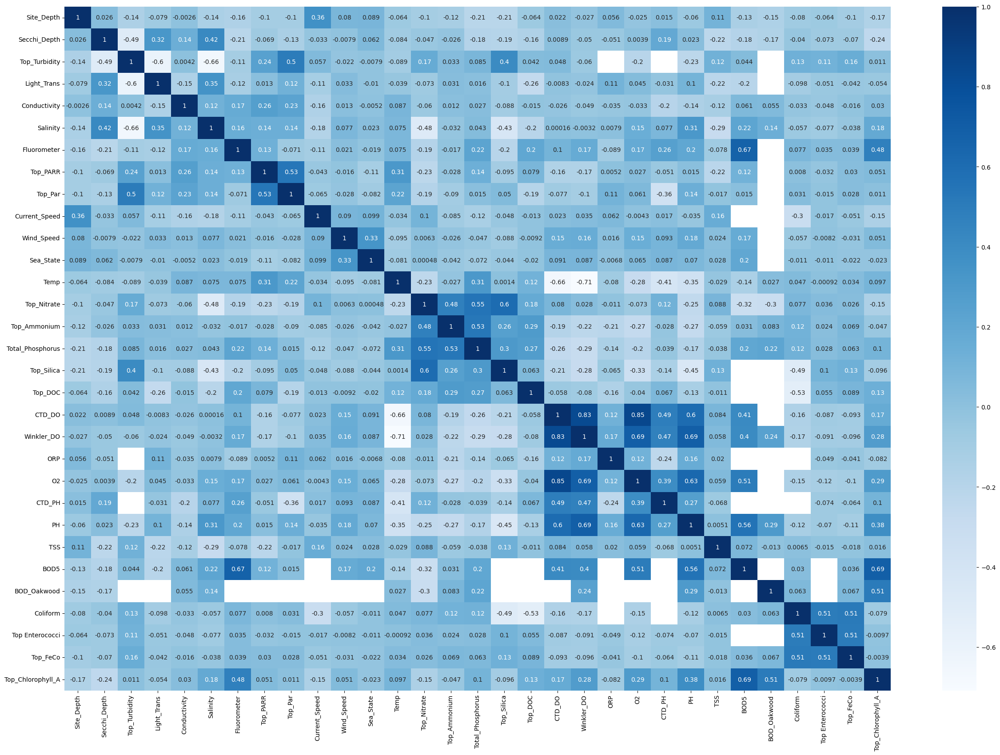

In [ ]:
import seaborn as sns
# only use numeric cols
numeric_cols = [col for col in df.columns if df[col].dtype != 'object']
# Create a heatmap using Seaborn
plt.figure(figsize=(30, 20))
sns.heatmap(df[numeric_cols].corr(), cmap='Blues', annot=True)
plt.show()

In [ ]:
## drop columns that are highly correlated step 5
#  CTD_DO and Winkler_DO (0.83), the missing data count:  19090 vs 10731 so CTD_DO is removed.
# the CTD profiler provides dissolved oxygen data in real-time,
# while the Winkler Method is laboratory-based method for values at a particular point in time

cols_drop = ['CTD_DO']
df = df.drop(columns=cols_drop)
print('after removing CTD_DO df shape', df.shape)

after removing CTD_DO df shape (40932, 33)


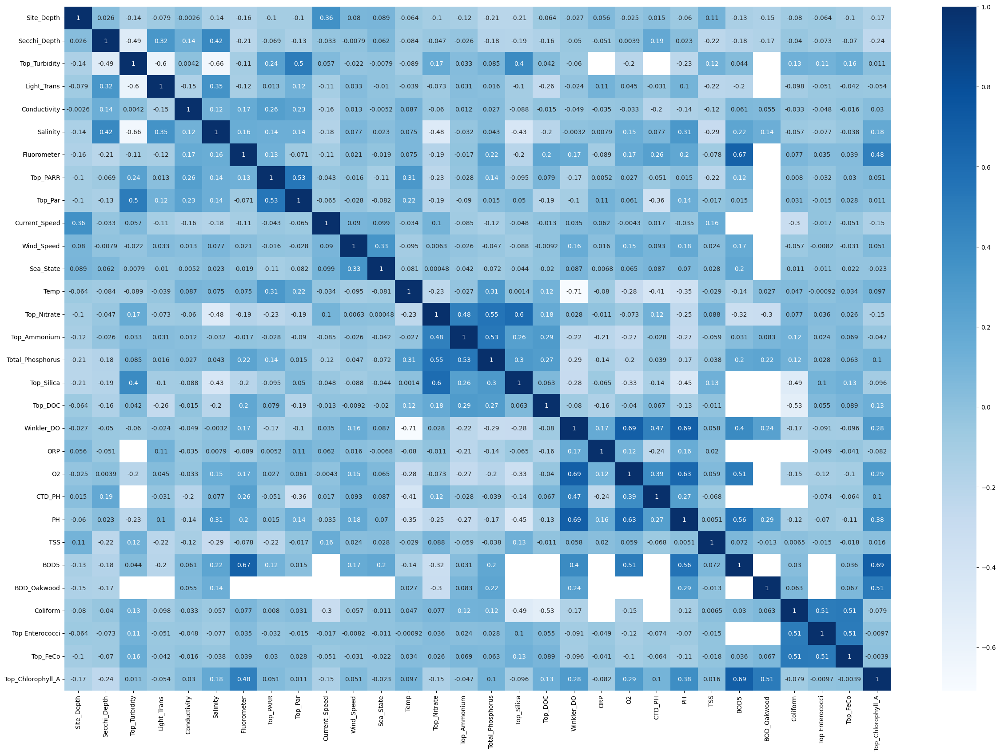

In [ ]:
import seaborn as sns
# only use numeric cols
numeric_cols = [col for col in df.columns if df[col].dtype != 'object']
# Create a heatmap using Seaborn
plt.figure(figsize=(30, 20))
sns.heatmap(df[numeric_cols].corr(), cmap='Blues', annot=True)
plt.show()

Remove negative O2 because the percentage should be positive values

In [ ]:

df2 = df.loc[(df['O2'] >= 0) | (df['O2'].isna())]
print(df.shape, df2.shape)

(40932, 33) (40919, 33)


In [ ]:
# save dataframe to 'no_imput.csv'
df2.to_csv('/content/drive/MyDrive/Colab Notebooks/no_imput_june2.csv', index=False)
df = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/no_imput_june2.csv')

In [ ]:
pd.set_option('display.max_columns', None)
df.describe(include='all')

,Site_Depth,Secchi_Depth,Top_Turbidity,Light_Trans,Conductivity,Salinity,Fluorometer,Top_PARR,Top_Par,Current_Speed,Wind_Speed,Sea_State,Temp,Top_Nitrate,Top_Ammonium,Total_Phosphorus,Top_Silica,Top_DOC,Winkler_DO,ORP,O2,CTD_PH,PH,TSS,BOD5,BOD_Oakwood,Coliform,Top Enterococci,Top_FeCo,Wind_Direction,Current_Direction,Weather,Top_Chlorophyll_A
count,40041.000000,32977.000000,7537.000000,16069.000000,25448.000000,27557.000000,18425.000000,15633.000000,16854.000000,21456.000000,29551.000000,31817,27797.000000,40521.000000,40416.000000,40332.000000,33257.000000,30373.000000,30195.00000,12615.000000,21712.000000,8077.000000,30537.000000,30434.000000,2052.000000,4013.000000,3543.000000,29334.000000,33962.000000,30455,35247,31436,40919.000000
unique,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,27,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,117,386,6,NaN
top,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,S,S,D,NaN
freq,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,26105,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5586,8484,14795,NaN
mean,30.180531,4.150908,7.796927,59.363688,4.655394,23.602335,12.065797,1161.870781,907.572278,0.745530,8.273057,NaN,18.166556,0.364924,0.421472,0.232397,2.167423,3.274388,6.99308,184.330365,75.008190,8.022175,7.624156,18.097950,2.482139,2.088213,4997.981089,223.727381,1281.694777,NaN,NaN,NaN,16.700431
std,20.902952,2.013759,16.292787,20.059297,6.429075,4.520869,18.372574,820.657810,1168.360692,0.708516,4.872351,NaN,6.675741,0.474703,0.715027,0.285813,2.244064,1.242452,2.58538,115.915553,24.788951,0.512746,0.330157,16.553305,1.368417,1.325752,17588.573566,2749.984385,10031.048333,NaN,NaN,NaN,24.451204
min,0.000000,0.500000,-1.100000,-12.310000,0.020000,0.100000,-99.000000,-99.000000,-99.000000,0.000000,0.000000,NaN,-0.805000,0.000000,0.000000,0.005000,0.013000,0.500000,0.00000,-454.000000,0.005335,4.735000,5.080000,0.500000,0.200000,0.100000,10.000000,0.000000,0.000000,NaN,NaN,NaN,0.000000
25%,15.000000,3.000000,2.170000,51.700000,2.805000,21.900000,2.935000,324.000000,36.000000,0.300000,5.000000,NaN,15.100000,0.174000,0.197750,0.130000,1.054000,2.640000,5.25000,128.500000,60.925375,7.665000,7.400000,8.500000,1.550000,1.150000,235.000000,2.000000,12.000000,NaN,NaN,NaN,2.890000
50%,23.000000,4.000000,3.920000,64.900000,3.430000,24.455000,7.170000,1295.000000,195.000000,0.500000,8.000000,NaN,20.560000,0.302000,0.320000,0.178000,1.730000,3.100000,6.55000,190.000000,74.800000,7.935000,7.605000,13.500000,2.100000,1.700000,850.000000,5.000000,48.000000,NaN,NaN,NaN,7.400000
75%,42.000000,5.000000,7.300000,72.850000,3.870278,26.515000,16.715000,1892.000000,1578.750000,1.000000,11.000000,NaN,23.065000,0.436000,0.472000,0.250000,2.598000,3.700000,8.42500,240.000000,87.500000,8.335000,7.835000,23.000000,3.062500,2.600000,3045.000000,28.000000,205.000000,NaN,NaN,NaN,20.900000


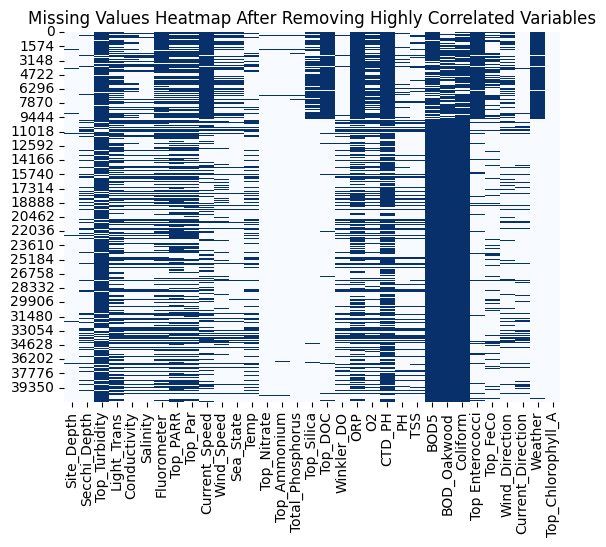

In [ ]:

# deep_sky_blue = (0/255, 191/255, 255/255)
sns.heatmap(df.isnull(), cmap='Blues', cbar=False)
plt.title('Missing Values Heatmap After Removing Highly Correlated Variables')
plt.show()

<Axes: >

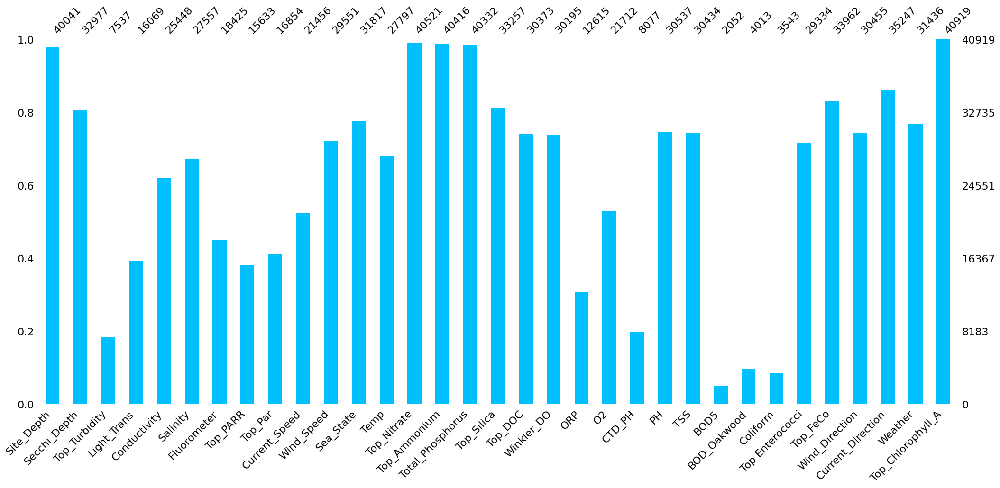

In [ ]:
# missing value visualisation
# Define RGB values for the colors
deep_sky_blue = (0/255, 191/255, 255/255)
import missingno as msno
msno.bar(df, color=deep_sky_blue )
# plt.savefig('/content/drive/MyDrive/Colab Notebooks/msnobar_no.png', dpi=300)

<Axes: >

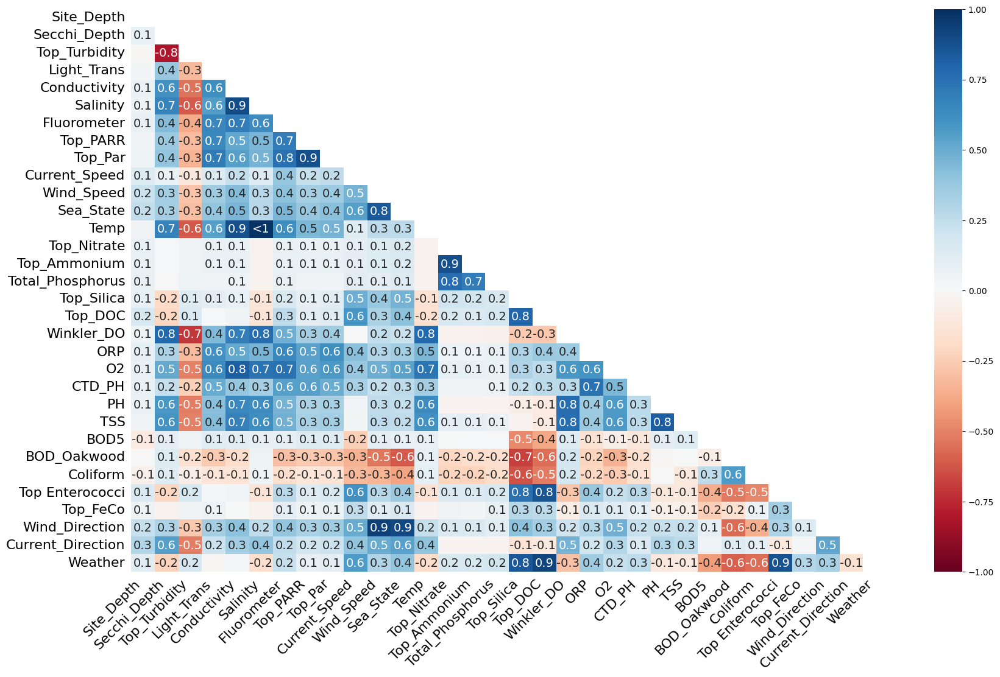

In [ ]:
#Interpreting the heatmap can help identify patterns and relationships
#between missing data in different features,
#which can inform data cleaning and imputation strategies.
# For example, if two features are highly correlated in terms of their missing values,
# then imputing the missing values of one feature based on the available data
# of the other feature may lead to more accurate results.
# missing value visualisation
msno.heatmap(df)
# plt.savefig('/content/drive/MyDrive/Colab Notebooks/msnoheat.png', dpi=300)

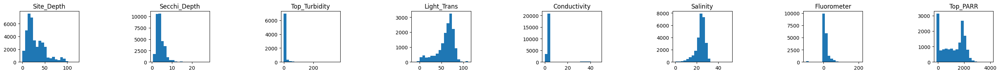

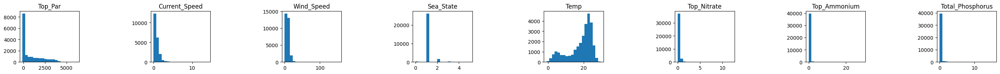

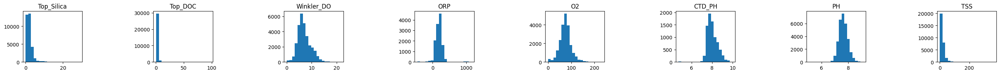

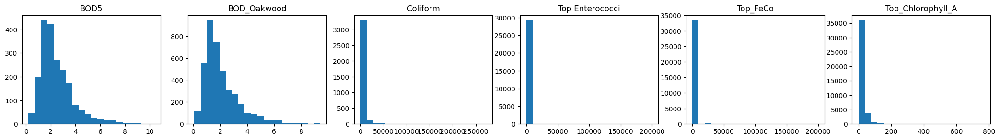

In [ ]:
# create a list of columns to plot histograms for
numeric_cols = [col for col in df.columns if df[col].dtype != 'object']
# set the number of columns to display per row
cols_per_row = 8
# create a counter variable to keep track of the number of subplots
count = 0
# create a new figure
fig = plt.figure(figsize=(35, 35))
# plot histograms for each column
for col in numeric_cols:
    count += 1
    plt.subplot(10, cols_per_row, count)
    plt.hist(df[col], bins=20)
    plt.title(col + '')
    plt.xlabel('')
    plt.ylabel('')

    # check if we have reached the maximum number of columns per row
    if count % cols_per_row == 0:
        plt.subplots_adjust(hspace=1, wspace=1.2)
        plt.show()
        fig = plt.figure(figsize=(35, 35))
        count = 0
# plt.savefig('/content/drive/MyDrive/Colab Notebooks/hist.png', dpi=300)
plt.show()

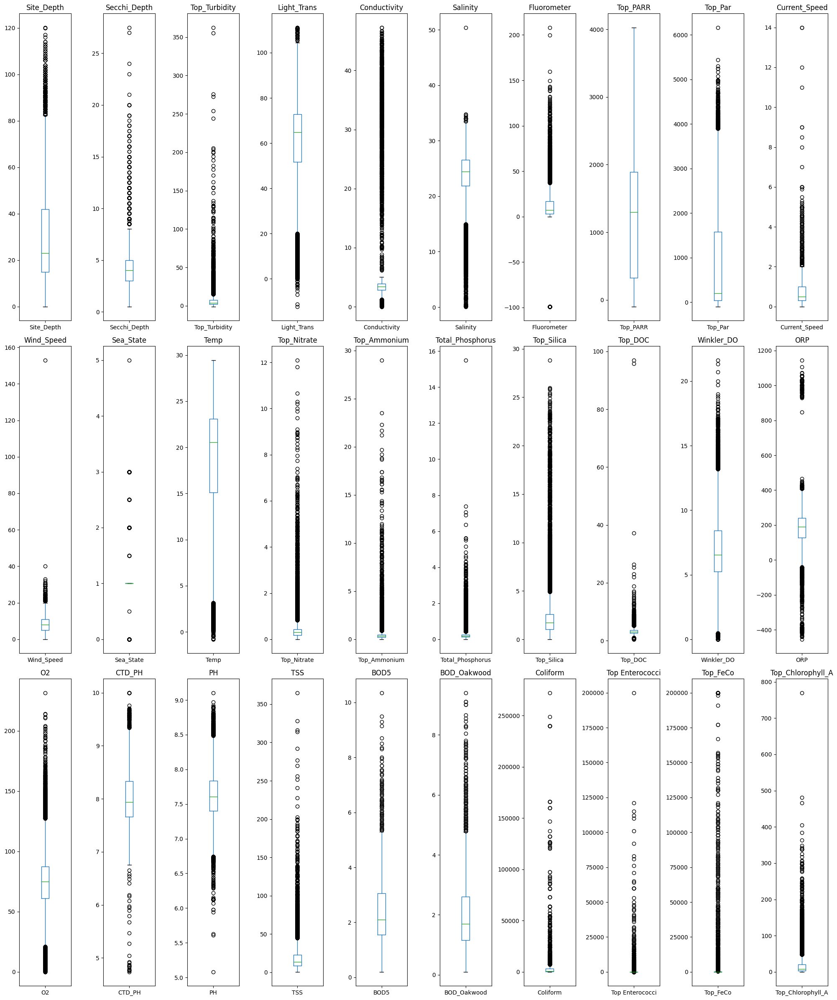

In [ ]:
# get the numeric columns
numeric_cols = [col for col in df.columns if df[col].dtype != 'object']
# set the number of columns per row
cols_per_row = 10
# calculate the number of rows needed
num_rows = (len(numeric_cols) - 1) // cols_per_row + 1
# create the subplots
fig, axs = plt.subplots(nrows=num_rows, ncols=cols_per_row, figsize=(20, 8*num_rows))
# iterate over the numeric columns and plot each one
for i, col in enumerate(numeric_cols):
    ax = axs[i // cols_per_row, i % cols_per_row]
    df.boxplot(column=col, ax=ax)
    ax.grid(False)
    ax.set_title(col)
# adjust the layout and display the plot
plt.tight_layout()
# plt.savefig('/content/drive/MyDrive/Colab Notebooks/boxplots.png', dpi=300)

In [ ]:
df.columns

Index(['Site_Depth', 'Secchi_Depth', 'Top_Turbidity', 'Light_Trans',
       'Conductivity', 'Salinity', 'Fluorometer', 'Top_PARR', 'Top_Par',
       'Current_Speed', 'Wind_Speed', 'Sea_State', 'Temp', 'Top_Nitrate',
       'Top_Ammonium', 'Total_Phosphorus', 'Top_Silica', 'Top_DOC',
       'Winkler_DO', 'ORP', 'O2', 'CTD_PH', 'PH', 'TSS', 'BOD5', 'BOD_Oakwood',
       'Coliform', 'Top Enterococci', 'Top_FeCo', 'Wind_Direction',
       'Current_Direction', 'Weather', 'Top_Chlorophyll_A'],
      dtype='object')

In [ ]:
# building up models
# features from previous studies :
#  'BOD_Oakwood' dos not coexist with many other features, so it 's excluded
# 1. Total_Phosphorus (PO4, mg/L),
# 2. Winkler_DO: dissolved oxygen (DO, mg/L),
# 3. Temp
# 4  BOD5
# 5. pH
# Target: Chlorophyll-a (Chl-a, μg/L),

In [ ]:
df_no_impu.columns

Index(['Site_Depth', 'Secchi_Depth', 'Top_Turbidity', 'Light_Trans',
       'Conductivity', 'Salinity', 'Fluorometer', 'Top_PARR', 'Top_Par',
       'Current_Speed', 'Wind_Speed', 'Sea_State', 'Temp', 'Top_Nitrate',
       'Top_Ammonium', 'Total_Phosphorus', 'Top_Silica', 'Top_DOC',
       'Winkler_DO', 'ORP', 'O2', 'CTD_PH', 'PH', 'TSS', 'BOD5', 'BOD_Oakwood',
       'Coliform', 'Top Enterococci', 'Top_FeCo', 'Wind_Direction',
       'Current_Direction', 'Weather', 'Top_Chlorophyll_A'],
      dtype='object')

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from sklearn.pipeline import Pipeline, make_pipeline
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.ensemble import RandomForestRegressor
from sklearn.neural_network import MLPRegressor
from sklearn.svm import SVR
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
from sklearn.model_selection import train_test_split, RandomizedSearchCV, cross_val_score
from scipy.stats import randint, uniform
from sklearn.compose import ColumnTransformer
from sklearn.impute import SimpleImputer
from scipy.stats import sem
import seaborn as sns
##visualize Pipeline
from sklearn import set_config
set_config(display="diagram")
import warnings
#suppress warnings
warnings.filterwarnings('ignore')

In [ ]:
df_no_impu = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/no_imput_june2.csv')
df_version1 = df_no_impu.loc[:, ['Winkler_DO', 'Temp','Total_Phosphorus', 'BOD5', 'PH', 'Top_Chlorophyll_A']]
df_version1 = df_version1.dropna()
df_version1_impu =df_no_impu.iloc[df_version1.index, :]
print('before:', df_version1.shape)
df_version1 = df_version1_impu.dropna(axis = 1)
print('after:', df_version1.shape)
# view dataframe missingness after filtering
x = df_version1.drop('Top_Chlorophyll_A', axis = 1)
y = df_version1['Top_Chlorophyll_A']
print('dataset with no imputation shape, excluding target', x.shape)
print('target shape', y.shape)

before: (1572, 6)
after: (1572, 10)
dataset with no imputation shape, excluding target (1572, 9)
target shape (1572,)


<Axes: >

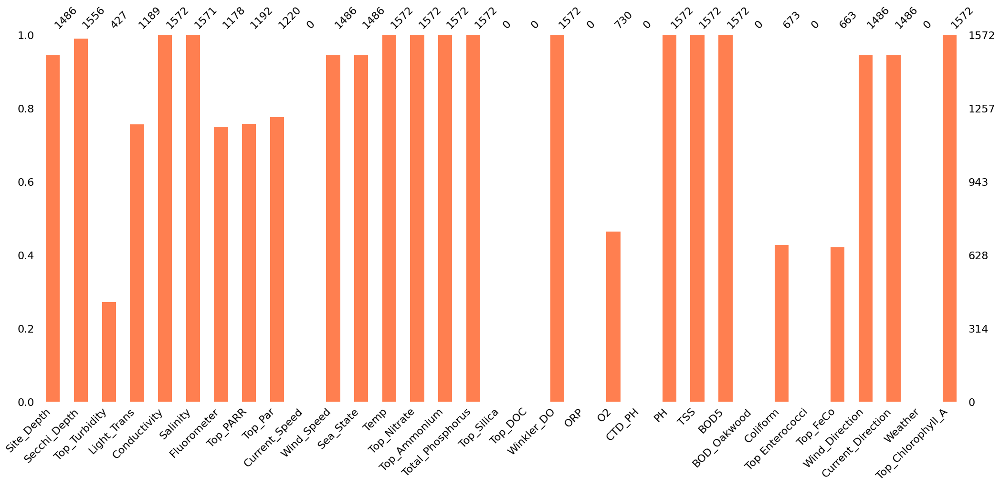

In [ ]:

# Define RGB values for the colors
Coral = (255/255, 127/255, 80/255)
import missingno as msno
msno.bar(df_version1_impu, color= Coral)


In [ ]:
df_version1.columns

Index(['Conductivity', 'Temp', 'Top_Nitrate', 'Top_Ammonium',
       'Total_Phosphorus', 'Winkler_DO', 'PH', 'TSS', 'BOD5',
       'Top_Chlorophyll_A'],
      dtype='object')

In [ ]:
# for the version of imputation
df_version1.index

Int64Index([   4,   21,   30,   36,   39,   41,   42,   43,   57,   59,
            ...
            9578, 9588, 9597, 9598, 9605, 9606, 9615, 9618, 9630, 9634],
           dtype='int64', length=1572)

In [ ]:

# Split the data into train80%, and test sets 20%
X_train, X_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=12)



# create scaling numeric values
numeric_processor=Pipeline(steps=[("scaler", StandardScaler())])
from sklearn.compose import ColumnTransformer
preprocessor = ColumnTransformer([("numerical", numeric_processor, ['Conductivity', 'Temp', 'Top_Nitrate', 'Top_Ammonium', 'Total_Phosphorus', 'Winkler_DO', 'PH', 'TSS', 'BOD5'])])

preprocessor

ColumnTransformer(transformers=[('numerical',
                                 Pipeline(steps=[('scaler', StandardScaler())]),
                                 ['Conductivity', 'Temp', 'Top_Nitrate',
                                  'Top_Ammonium', 'Total_Phosphorus',
                                  'Winkler_DO', 'PH', 'TSS', 'BOD5'])])

# **Baseline Random Forest with no imputation**

In [ ]:
####################### RF no imputation Version 1 #############################
pipe_RF = make_pipeline( preprocessor, RandomForestRegressor(random_state=12))
pipe_RF

Pipeline(steps=[('columntransformer',
                 ColumnTransformer(transformers=[('numerical',
                                                  Pipeline(steps=[('scaler',
                                                                   StandardScaler())]),
                                                  ['Conductivity', 'Temp',
                                                   'Top_Nitrate',
                                                   'Top_Ammonium',
                                                   'Total_Phosphorus',
                                                   'Winkler_DO', 'PH', 'TSS',
                                                   'BOD5'])])),
                ('randomforestregressor',
                 RandomForestRegressor(random_state=12))])

Best hyperparameters: {'randomforestregressor__criterion': 'poisson', 'randomforestregressor__max_depth': 47, 'randomforestregressor__max_features': 'sqrt', 'randomforestregressor__min_samples_leaf': 3, 'randomforestregressor__min_samples_split': 6, 'randomforestregressor__n_estimators': 226}

RF test Root Mean Squared Error: 10.536814666705096
RF test Mean Absolute Error: 6.686719693859074
RF test R-squared: 0.7639391136025898

RF cross-validation R-squared: 0.7976156013902338 +/- 0.011186586457830609
RF cross-validation RMSE: 11.21357890274721 +/- 0.4442890605184693
RF cross-validation MAE: 7.1796302002467645 +/- 0.1804407401405505


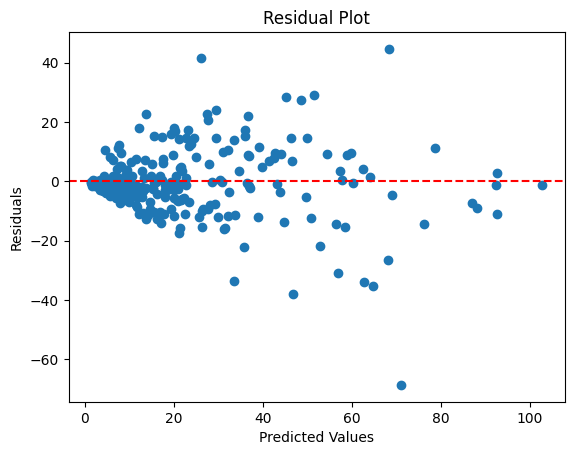

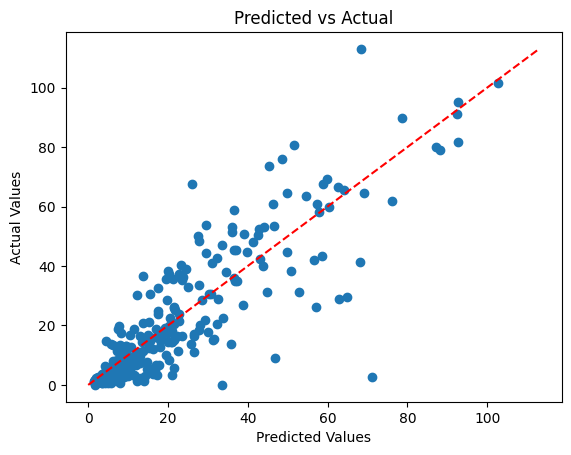

In [ ]:


# Define the parameter grid for random search
param_grid = {
    'randomforestregressor__n_estimators': randint(50, 301),
    'randomforestregressor__max_depth': randint(20, 51),
    'randomforestregressor__min_samples_split': randint(2, 21),
    'randomforestregressor__min_samples_leaf': randint(1, 21),
    'randomforestregressor__max_features': ['sqrt', 'log2', 1],
    'randomforestregressor__criterion': ['squared_error', 'absolute_error', 'friedman_mse', 'poisson']
}



# Perform random search with cross-validation on the training set
random_search = RandomizedSearchCV(pipe_RF, param_distributions=param_grid, n_iter=20, cv=5, scoring='neg_mean_squared_error', random_state=12)
random_search.fit(X_train, y_train)

# Print the best hyperparameters
print(f"Best hyperparameters: {random_search.best_params_}")

# Train the model with the best hyperparameters on the training set
best_model = random_search.best_estimator_
best_model.fit(X_train, y_train)

# Evaluate the best model on the test set
y_pred_test = best_model.predict(X_test)
mse_test = mean_squared_error(y_test, y_pred_test)
rmse_test = mse_test ** 0.5
mae_test = mean_absolute_error(y_test, y_pred_test)
r2_test = r2_score(y_test, y_pred_test)
print()
print(f"RF test Root Mean Squared Error: {rmse_test}")
print(f"RF test Mean Absolute Error: {mae_test}")
print(f"RF test R-squared: {r2_test}")

# Evaluate the best model using cross-validation and report R2, RMSE, MAE, and SE
cv_r2_scores = cross_val_score(best_model, X_train, y_train, cv=5, scoring='r2')
cv_rmse_scores = np.sqrt(-cross_val_score(best_model, X_train, y_train, cv=5, scoring='neg_mean_squared_error'))
cv_mae_scores = -cross_val_score(best_model, X_train, y_train, cv=5, scoring='neg_mean_absolute_error')

cv_r2_mean = np.mean(cv_r2_scores)
cv_rmse_mean = np.mean(cv_rmse_scores)
cv_mae_mean = np.mean(cv_mae_scores)

cv_r2_se = sem(cv_r2_scores)
cv_rmse_se = sem(cv_rmse_scores)
cv_mae_se = sem(cv_mae_scores)

print()
print(f"RF cross-validation mean R-squared: {cv_r2_mean} +/- {cv_r2_se}")
print(f"RF cross-validation mean RMSE: {cv_rmse_mean} +/- {cv_rmse_se}")
print(f"RF cross-validation mean MAE: {cv_mae_mean} +/- {cv_mae_se}")

residuals = y_test - y_pred_test

# Plotting the residuals
plt.scatter(y_pred_test, residuals)
plt.axhline(y=0, color='r', linestyle='--')
plt.xlabel('Predicted Values')
plt.ylabel('Residuals')
plt.title('Residual Plot')
plt.show()

# Plotting the predicted vs actual values
plt.scatter(y_pred_test, y_test)
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--')
plt.xlabel('Predicted Values')
plt.ylabel('Actual Values')
plt.title('Predicted vs Actual')
plt.show()

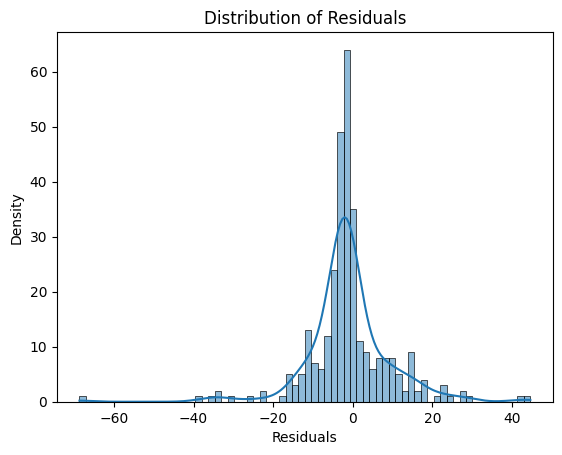

In [ ]:
sns.histplot(residuals, kde=True)
plt.xlabel('Residuals')
plt.ylabel('Density')
plt.title('Distribution of Residuals')
plt.show()

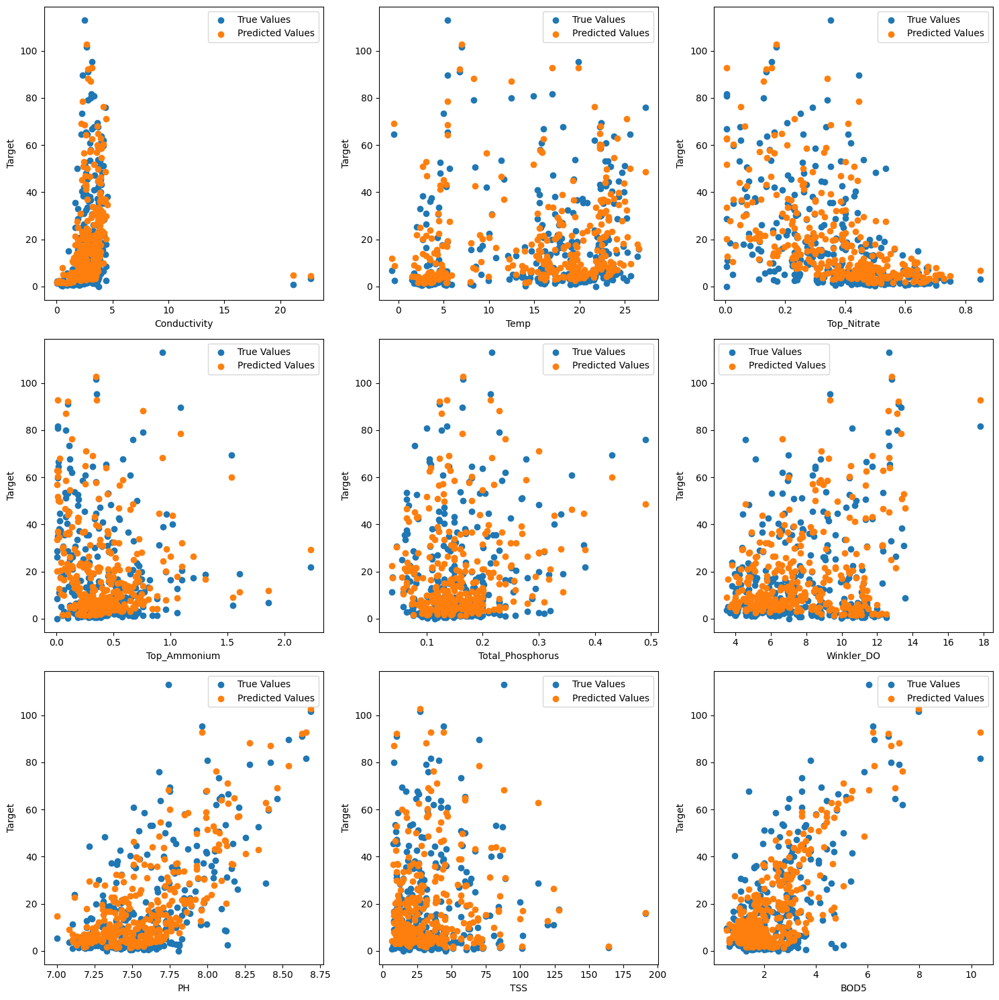

In [ ]:
feature_names = x.columns.tolist()
num_features = len(feature_names)
num_cols = 3
num_rows = int(np.ceil(num_features / num_cols))

fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, 5 * num_rows))

for i, ax in enumerate(axes.flatten()):
    if i < num_features:
        feature = feature_names[i]
        ax.scatter(X_test[feature], y_test, label='True Values')
        ax.scatter(X_test[feature], y_pred_test, label='Predicted Values')
        ax.set_xlabel(feature)
        ax.set_ylabel('Target')
        ax.legend()

plt.tight_layout()
plt.show()


## **SVR no imputation**

In [ ]:
####################### SVR  no imputation Version 1 #############################
pipe_SVR = make_pipeline(preprocessor, SVR())
pipe_SVR

Pipeline(steps=[('columntransformer',
                 ColumnTransformer(transformers=[('numerical',
                                                  Pipeline(steps=[('scaler',
                                                                   StandardScaler())]),
                                                  ['Conductivity', 'Temp',
                                                   'Top_Nitrate',
                                                   'Top_Ammonium',
                                                   'Total_Phosphorus',
                                                   'Winkler_DO', 'PH', 'TSS',
                                                   'BOD5'])])),
                ('svr', SVR())])

Best hyperparameters: {'svr__C': 90.17148541170121, 'svr__degree': 5, 'svr__epsilon': 0.8262441105953845, 'svr__gamma': 'auto', 'svr__kernel': 'rbf', 'svr__shrinking': True, 'svr__tol': 0.00029382835295794585}

SVR test Root Mean Squared Error: 10.40591018323257
SVR test Mean Absolute Error: 6.16706200223932
SVR test R-squared: 0.7697681002343316

SVR cross-validation mean R-squared: 0.8406398309045704 +/- 0.008254705286902565
SVR cross-validation mean RMSE: 9.955929951502412 +/- 0.4022282652244168
SVR cross-validation mean MAE: 6.158436181379036 +/- 0.12398742850024307


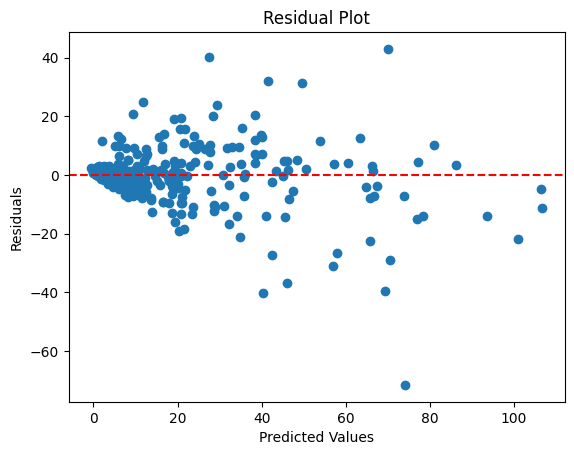

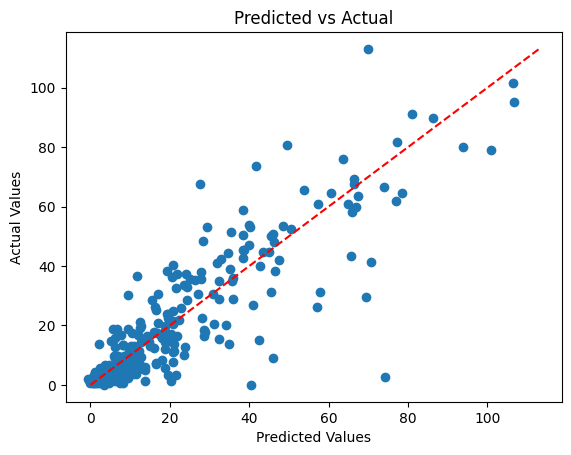

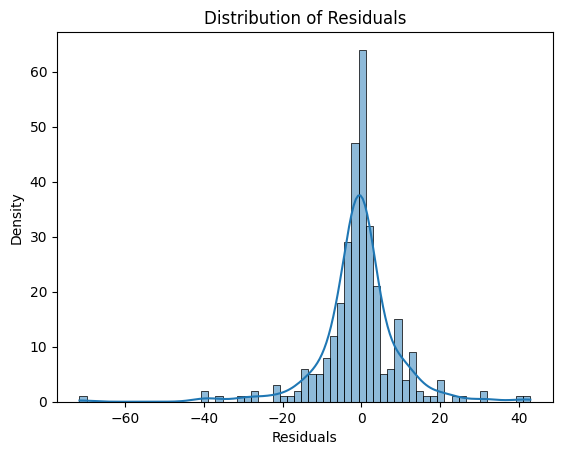

In [ ]:

# Define the parameter grid for random search
param_dist = {
    'svr__C': uniform(0.1, 100),
    'svr__kernel': ['linear', 'poly', 'rbf'],
    'svr__degree': randint(0, 6),
    'svr__epsilon': uniform(0.001, 10),
    'svr__gamma': ['scale', 'auto'],
    'svr__shrinking': [True, False],
    'svr__tol': uniform(1e-5, 1e-3),
}


# Create the SVR pipeline
pipe_SVR = make_pipeline(StandardScaler(), SVR())

# Perform random search with cross-validation on the training set
random_search = RandomizedSearchCV(pipe_SVR, param_distributions=param_dist, n_iter=10, cv=5, scoring='neg_mean_squared_error', random_state=12)
random_search.fit(X_train, y_train)

# Print the best hyperparameters
print(f"Best hyperparameters: {random_search.best_params_}")

# Train the model with the best hyperparameters on the training set
best_model = random_search.best_estimator_
best_model.fit(X_train, y_train)

# Evaluate the best model on the test set
y_pred_test = best_model.predict(X_test)
mse_test = mean_squared_error(y_test, y_pred_test)
rmse_test = mse_test ** 0.5
mae_test = mean_absolute_error(y_test, y_pred_test)
r2_test = r2_score(y_test, y_pred_test)
print()
print(f"SVR test Root Mean Squared Error: {rmse_test}")
print(f"SVR test Mean Absolute Error: {mae_test}")
print(f"SVR test R-squared: {r2_test}")

# Evaluate the best model using cross-validation and report R2, RMSE, MAE, and STD
cv_r2_scores = cross_val_score(best_model, X_train, y_train, cv=5, scoring='r2')
cv_rmse_scores = np.sqrt(-cross_val_score(best_model, X_train, y_train, cv=5, scoring='neg_mean_squared_error'))
cv_mae_scores = -cross_val_score(best_model, X_train, y_train, cv=5, scoring='neg_mean_absolute_error')

cv_r2_mean = np.mean(cv_r2_scores)
cv_rmse_mean = np.mean(cv_rmse_scores)
cv_mae_mean = np.mean(cv_mae_scores)

cv_r2_se = sem(cv_r2_scores)
cv_rmse_se = sem(cv_rmse_scores)
cv_mae_se = sem(cv_mae_scores)

print()
print(f"SVR cross-validation mean R-squared: {cv_r2_mean} +/- {cv_r2_se}")
print(f"SVR cross-validation mean RMSE: {cv_rmse_mean} +/- {cv_rmse_se}")
print(f"SVR cross-validation mean MAE: {cv_mae_mean} +/- {cv_mae_se}")

residuals = y_test - y_pred_test

# Plotting the residuals
plt.scatter(y_pred_test, residuals)
plt.axhline(y=0, color='r', linestyle='--')
plt.xlabel('Predicted Values')
plt.ylabel('Residuals')
plt.title('Residual Plot')
plt.show()

# Plotting the predicted vs actual values
plt.scatter(y_pred_test, y_test)
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--')
plt.xlabel('Predicted Values')
plt.ylabel('Actual Values')
plt.title('Predicted vs Actual')
plt.show()

sns.histplot(residuals, kde=True)
plt.xlabel('Residuals')
plt.ylabel('Density')
plt.title('Distribution of Residuals')
plt.show()

## **ANN with No Imputation**





Best hyperparameters: {'mlpregressor__activation': 'logistic', 'mlpregressor__alpha': 0.3795504577114115, 'mlpregressor__batch_size': 100, 'mlpregressor__beta_1': 0.3194763109335812, 'mlpregressor__beta_2': 0.2914566850066529, 'mlpregressor__early_stopping': False, 'mlpregressor__epsilon': 1e-08, 'mlpregressor__hidden_layer_sizes': 197, 'mlpregressor__learning_rate': 'adaptive', 'mlpregressor__learning_rate_init': 0.00912707031795312, 'mlpregressor__momentum': 0.3694738186070894, 'mlpregressor__n_iter_no_change': 5, 'mlpregressor__nesterovs_momentum': False, 'mlpregressor__power_t': 0.7956740312285981, 'mlpregressor__shuffle': False, 'mlpregressor__solver': 'sgd', 'mlpregressor__tol': 5.75762263380688e-05, 'mlpregressor__validation_fraction': 0.41861143293176695, 'mlpregressor__warm_start': True}

ANN test Root Mean Squared Error: 10.517365756648923
ANN test Mean Absolute Error: 6.6240945932212565
ANN test R-squared: 0.7648097542902772

ANN cross-validation mean R-squared: 0.8477057333

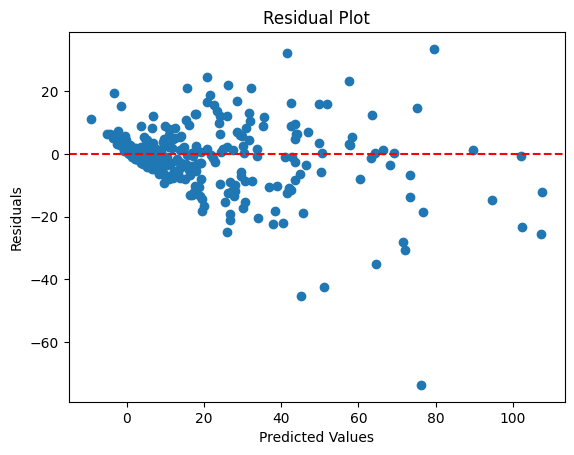

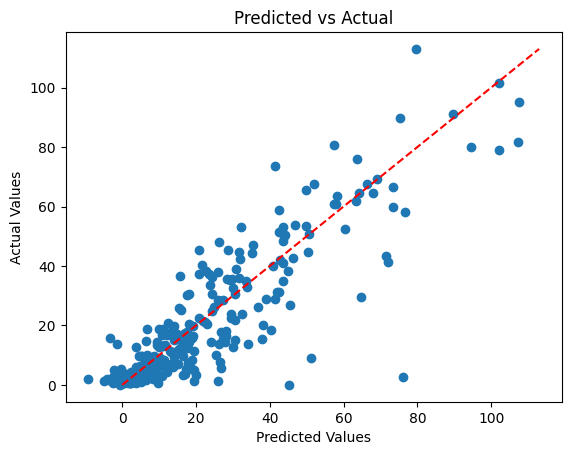

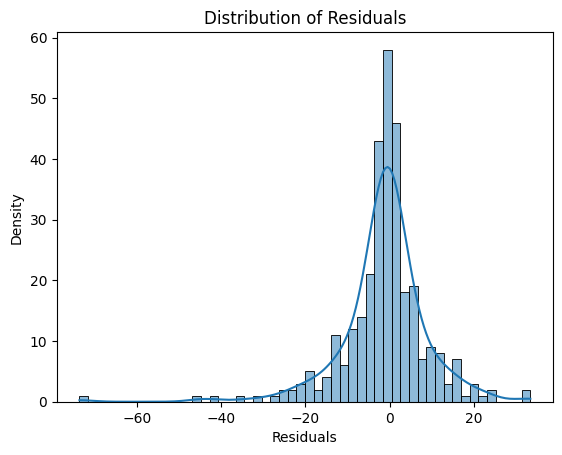

In [ ]:
# 4m Best
pipe_ANN = make_pipeline(preprocessor, MLPRegressor(max_iter=2000, random_state=12))

# Define the parameter distribution for the ANN
param_dist = {
    'mlpregressor__hidden_layer_sizes': randint(50, 201),
    'mlpregressor__activation': ['identity', 'logistic', 'tanh', 'relu'],
    'mlpregressor__solver': ['sgd', 'adam'],
    'mlpregressor__alpha': uniform(0.0001, 1),
    'mlpregressor__n_iter_no_change': randint(5, 20),
    'mlpregressor__early_stopping': [True, False],
    'mlpregressor__learning_rate_init': uniform(0.0001, 0.01),
    'mlpregressor__shuffle': [True, False],
    'mlpregressor__tol': uniform(1e-5, 1e-3),
    'mlpregressor__warm_start': [True, False],
    'mlpregressor__learning_rate': ['constant', 'invscaling', 'adaptive'],
    'mlpregressor__power_t': uniform(0.1, 1.0),
    'mlpregressor__momentum': uniform(0.1, 1),
    'mlpregressor__nesterovs_momentum': [True, False],
    'mlpregressor__beta_1': uniform(0, 1.0),
    'mlpregressor__beta_2': uniform(0, 1.0),
    'mlpregressor__epsilon': [1e-8, 1e-7, 1e-9],
    'mlpregressor__validation_fraction': uniform(0.1, 1),
    'mlpregressor__batch_size': ['auto', 100, 200]
}



# Perform random search with cross-validation on the training set
random_search = RandomizedSearchCV(pipe_ANN, param_distributions=param_dist, n_iter=20, cv=5, scoring='neg_mean_squared_error', random_state=12)
random_search.fit(X_train, y_train)

# Print the best hyperparameters
print(f"Best hyperparameters: {random_search.best_params_}")

# Train the model with the best hyperparameters on the training set
best_model = random_search.best_estimator_
best_model.fit(X_train, y_train)

# Evaluate the best model on the test set
y_pred_test = best_model.predict(X_test)
mse_test = mean_squared_error(y_test, y_pred_test)
rmse_test = mse_test ** 0.5
mae_test = mean_absolute_error(y_test, y_pred_test)
r2_test = r2_score(y_test, y_pred_test)
print()
print(f"ANN test Root Mean Squared Error: {rmse_test}")
print(f"ANN test Mean Absolute Error: {mae_test}")
print(f"ANN test R-squared: {r2_test}")

# Evaluate the best model using cross-validation and report R2, RMSE, MAE, and STD
cv_r2_scores = cross_val_score(best_model, X_train, y_train, cv=5, scoring='r2')
cv_rmse_scores = np.sqrt(-cross_val_score(best_model, X_train, y_train, cv=5, scoring='neg_mean_squared_error'))
cv_mae_scores = -cross_val_score(best_model, X_train, y_train, cv=5, scoring='neg_mean_absolute_error')
cv_r2_std = cv_r2_scores.std()
cv_rmse_std = cv_rmse_scores.std()
cv_mae_std = cv_mae_scores.std()

cv_r2_mean = np.mean(cv_r2_scores)
cv_rmse_mean = np.mean(cv_rmse_scores)
cv_mae_mean = np.mean(cv_mae_scores)

cv_r2_se = sem(cv_r2_scores)
cv_rmse_se = sem(cv_rmse_scores)
cv_mae_se = sem(cv_mae_scores)

print()
print(f"ANN cross-validation mean R-squared: {cv_r2_mean} +/- {cv_r2_se}")
print(f"ANN cross-validation mean RMSE: {cv_rmse_mean} +/- {cv_rmse_se}")
print(f"ANN cross-validation mean MAE: {cv_mae_mean} +/- {cv_mae_se}")

residuals = y_test - y_pred_test

# Plotting the residuals
plt.scatter(y_pred_test, residuals)
plt.axhline(y=0, color='r', linestyle='--')
plt.xlabel('Predicted Values')
plt.ylabel('Residuals')
plt.title('Residual Plot')
plt.show()

# Plotting the predicted vs actual values
plt.scatter(y_pred_test, y_test)
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--')
plt.xlabel('Predicted Values')
plt.ylabel('Actual Values')
plt.title('Predicted vs Actual')
plt.show()

sns.histplot(residuals, kde=True)
plt.xlabel('Residuals')
plt.ylabel('Density')
plt.title('Distribution of Residuals')
plt.show()

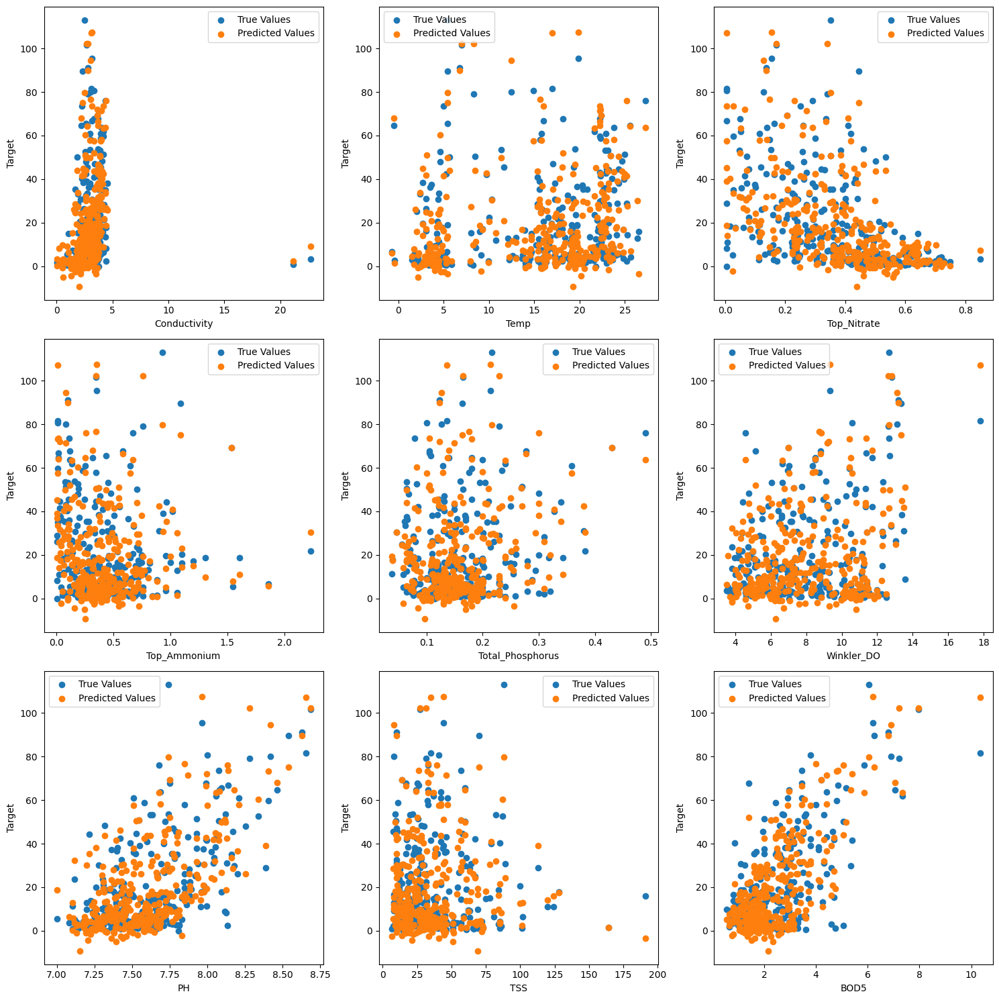

In [ ]:
feature_names = x.columns.tolist()
num_features = len(feature_names)
num_cols = 3
num_rows = int(np.ceil(num_features / num_cols))

fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, 5 * num_rows))

for i, ax in enumerate(axes.flatten()):
    if i < num_features:
        feature = feature_names[i]
        ax.scatter(X_test[feature], y_test, label='True Values')
        ax.scatter(X_test[feature], y_pred_test, label='Predicted Values')
        ax.set_xlabel(feature)
        ax.set_ylabel('Target')
        ax.legend()

plt.tight_layout()
plt.show()